First, we're going to develop a model that simply generates a copy of the input.

In [1]:
import os

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.models import Sequential
from keras.layers import Dense, Dropout, BatchNormalization, Conv2DTranspose, Conv2D, UpSampling2D, Reshape, Flatten, MaxPooling2D, LeakyReLU
from keras.optimizers import RMSprop, SGD
from IPython.display import Image, display
from itertools import repeat
import PIL
from datetime import datetime

import numpy as np

partial_batch_size = 16
scale_up = 4

datagen = ImageDataGenerator(
        rotation_range=10,
        width_shift_range=0.1,
        height_shift_range=0.1,
        rescale=1./255,
        shear_range=0.005,
        zoom_range=0.2,
        horizontal_flip=False,
        fill_mode='nearest')

fake_data_gen = datagen.flow_from_directory(os.getcwd()+'/training_eye/', target_size=(64,64),batch_size=partial_batch_size)

def output_to_image(array):
    array = array*255
    i = array_to_img(array).resize((64*scale_up,64*scale_up), PIL.Image.ANTIALIAS)
    return i

Using TensorFlow backend.


Found 729 images belonging to 3 classes.


In [3]:
def get_generator():
    m = Sequential()
    m.add(Conv2D(32,3, input_shape=(64,64,3,), activation = LeakyReLU(), padding='same'))
    m.add(MaxPooling2D(2,2))
    m.add(Dropout(0.5))
    m.add(Conv2D(32,3, activation = LeakyReLU(), padding='same'))
    m.add(MaxPooling2D(2,2))
    m.add(Dropout(0.5))
    m.add(Conv2D(64,3, activation = LeakyReLU(), padding='same'))
    m.add(MaxPooling2D(2,2))
    m.add(Dropout(0.5))
    m.add(Flatten())
    m.add(Dense((1024), input_shape=(100,), activation = 'relu'))
    m.add(Reshape((4,4,int(1024/4/4))))
    m.add(UpSampling2D())
    m.add(Conv2DTranspose(512,8, activation = 'relu', padding='same'))
    m.add(BatchNormalization())
    m.add(UpSampling2D())
    m.add(Conv2DTranspose(256,5, activation = 'relu', padding='same'))
    m.add(BatchNormalization())
    m.add(UpSampling2D())
    m.add(Conv2DTranspose(128,5, activation = 'relu', padding='same'))
    m.add(BatchNormalization())
    m.add(UpSampling2D())
    m.add(Conv2DTranspose(64,5, activation = 'relu', padding='same'))
    m.add(BatchNormalization())
    m.add(Conv2DTranspose(3,5, activation = 'sigmoid', padding='same'))
    return m

get_generator().summary()


def l1_norm(y_true, y_pred):
    
    from keras import backend as K
    return K.sum(K.abs(y_pred - y_true))

def compile_generator(generator):
    generator.compile(loss=l1_norm, optimizer=RMSprop(lr=0.0001))
    return generator


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/activations.py:103: UserWarning: Do not pass a layer instance (such as LeakyReLU) as the activation argument of another layer. Instead, advanced activation layers should be used just like any other layer in a model.
  ).format(identifier=identifier.__class__.__name__))


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 64, 64, 32)        896       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_5 (Dropout)          (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 16, 16, 64)        18496     
__________

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/activations.py:103: UserWarning: Do not pass a layer instance (such as LeakyReLU) as the activation argument of another layer. Instead, advanced activation layers should be used just like any other layer in a model.
  ).format(identifier=identifier.__class__.__name__))


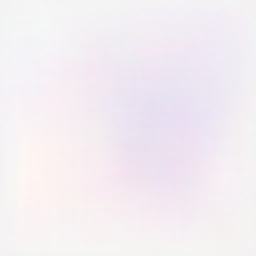

2017-08-03 23:09:56.893716: Step: 0, Generator: 48975.796875


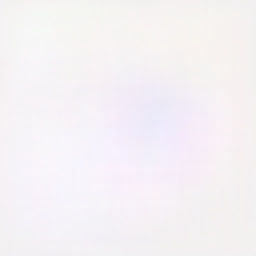

2017-08-03 23:10:04.266448: Step: 1, Generator: 49135.289062


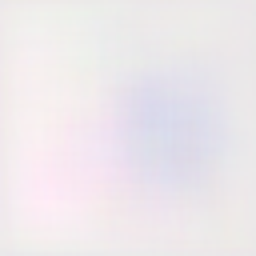

2017-08-03 23:10:13.017367: Step: 2, Generator: 44377.843750


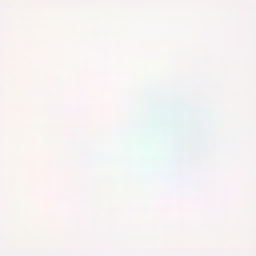

2017-08-03 23:10:21.051156: Step: 3, Generator: 36308.152344


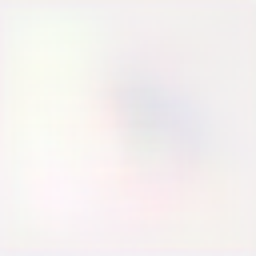

2017-08-03 23:10:28.381853: Step: 4, Generator: 32777.222656


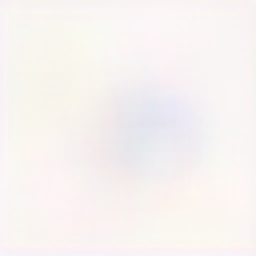

2017-08-03 23:10:35.555423: Step: 5, Generator: 34203.410156


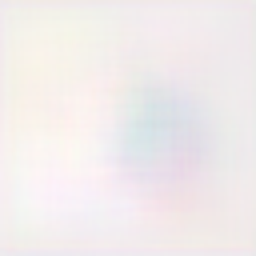

2017-08-03 23:10:44.321880: Step: 6, Generator: 27455.101562


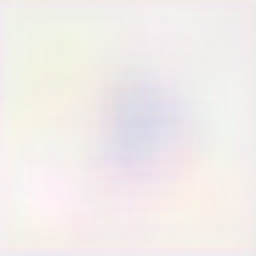

2017-08-03 23:10:52.663407: Step: 7, Generator: 29196.457031


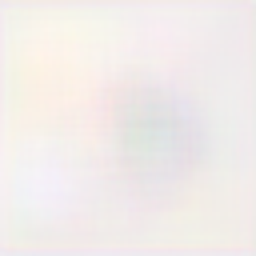

2017-08-03 23:11:00.986230: Step: 8, Generator: 27518.376953


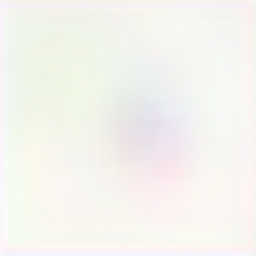

2017-08-03 23:11:09.126908: Step: 9, Generator: 24066.617188


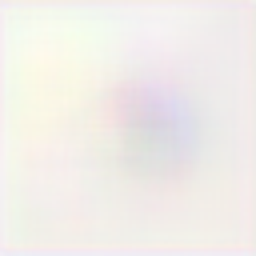

2017-08-03 23:11:18.478130: Step: 10, Generator: 26575.085938


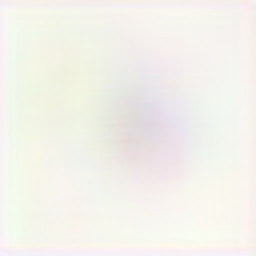

2017-08-03 23:11:26.216908: Step: 11, Generator: 25995.996094


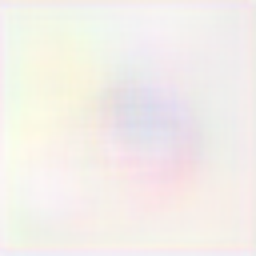

2017-08-03 23:11:33.882869: Step: 12, Generator: 23809.238281


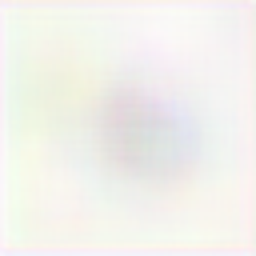

2017-08-03 23:11:42.243408: Step: 13, Generator: 20623.953125


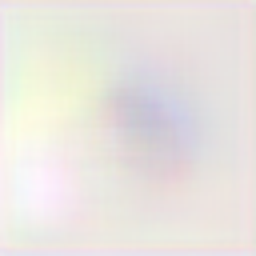

2017-08-03 23:11:50.754499: Step: 14, Generator: 25537.794922


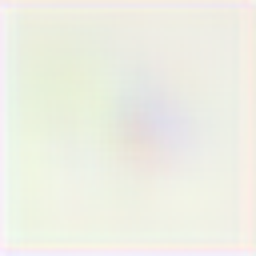

2017-08-03 23:11:59.097353: Step: 15, Generator: 23809.613281


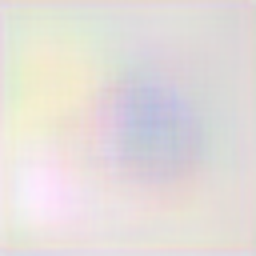

2017-08-03 23:12:08.492373: Step: 16, Generator: 20781.013672


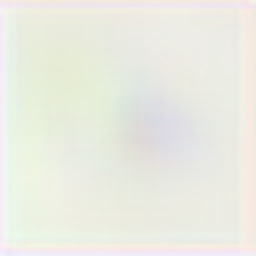

2017-08-03 23:12:17.194593: Step: 17, Generator: 21391.460938


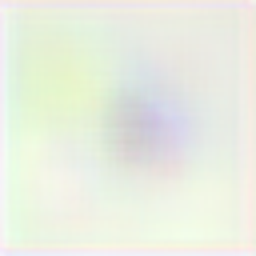

2017-08-03 23:12:24.824889: Step: 18, Generator: 21451.617188


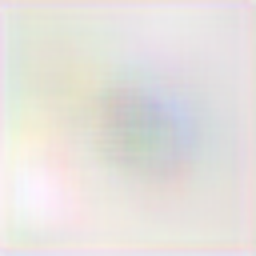

2017-08-03 23:12:32.109333: Step: 19, Generator: 21582.169922


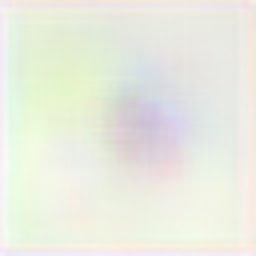

2017-08-03 23:12:39.033917: Step: 20, Generator: 21642.091797


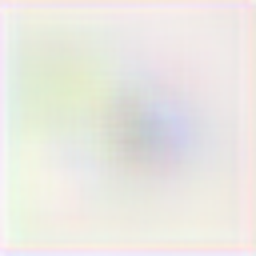

2017-08-03 23:12:46.149292: Step: 21, Generator: 21701.269531


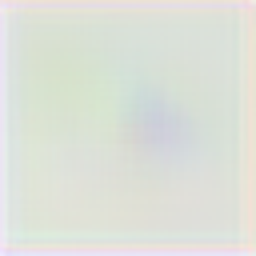

2017-08-03 23:12:53.316124: Step: 22, Generator: 26438.410156


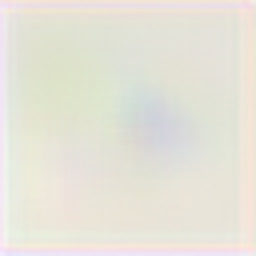

2017-08-03 23:13:00.406552: Step: 23, Generator: 22546.332031


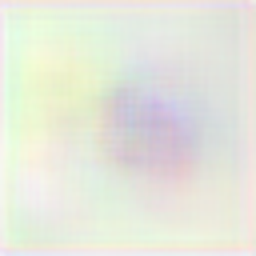

2017-08-03 23:13:07.407523: Step: 24, Generator: 20195.400391


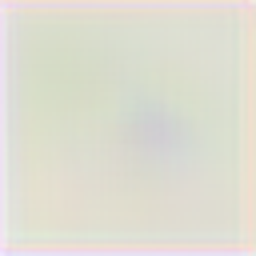

2017-08-03 23:13:14.314525: Step: 25, Generator: 21650.792969


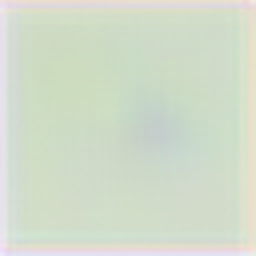

2017-08-03 23:13:21.234832: Step: 26, Generator: 21492.902344


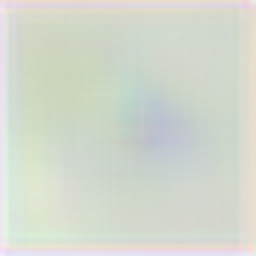

2017-08-03 23:13:27.919096: Step: 27, Generator: 20685.441406


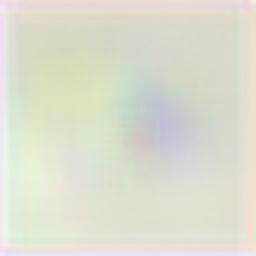

2017-08-03 23:13:34.964120: Step: 28, Generator: 22484.875000


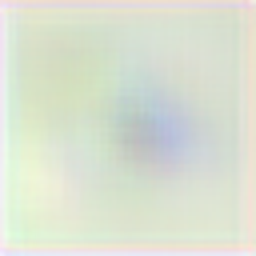

2017-08-03 23:13:41.918492: Step: 29, Generator: 19577.013672


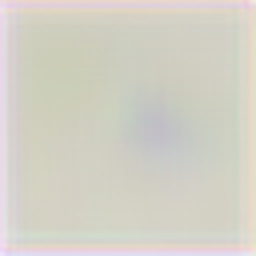

2017-08-03 23:13:48.573823: Step: 30, Generator: 19186.070312


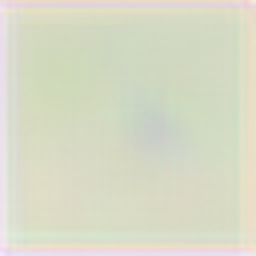

2017-08-03 23:13:55.578802: Step: 31, Generator: 19341.630859


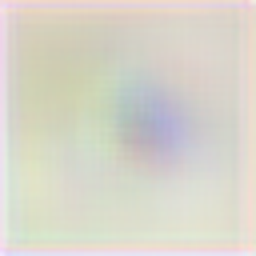

2017-08-03 23:14:02.619134: Step: 32, Generator: 19567.804688


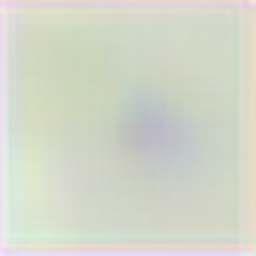

2017-08-03 23:14:11.113937: Step: 33, Generator: 20822.072266


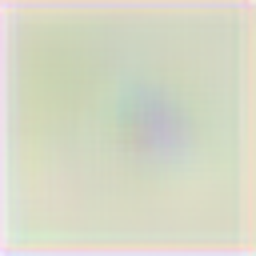

2017-08-03 23:14:19.330308: Step: 34, Generator: 21428.343750


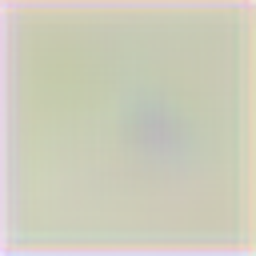

2017-08-03 23:14:26.613126: Step: 35, Generator: 20195.812500


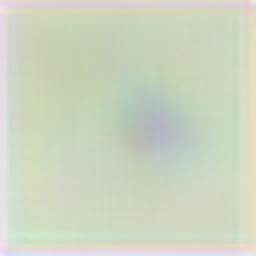

2017-08-03 23:14:33.599354: Step: 36, Generator: 18344.214844


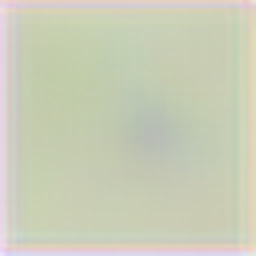

2017-08-03 23:14:40.264404: Step: 37, Generator: 18213.080078


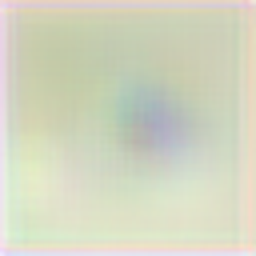

2017-08-03 23:14:47.248272: Step: 38, Generator: 20346.859375


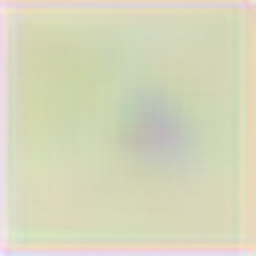

2017-08-03 23:14:54.227824: Step: 39, Generator: 21559.777344


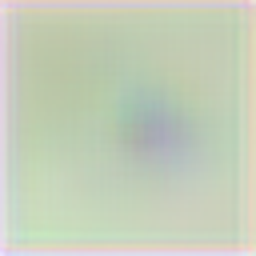

2017-08-03 23:15:01.212098: Step: 40, Generator: 18864.212891


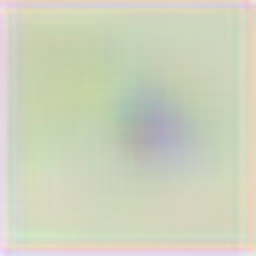

2017-08-03 23:15:07.895991: Step: 41, Generator: 17620.222656


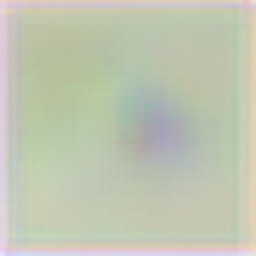

2017-08-03 23:15:14.908443: Step: 42, Generator: 21286.835938


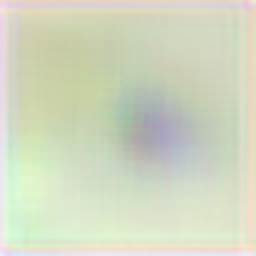

2017-08-03 23:15:21.916735: Step: 43, Generator: 17529.373047


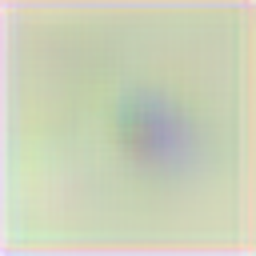

2017-08-03 23:15:28.870986: Step: 44, Generator: 20049.763672


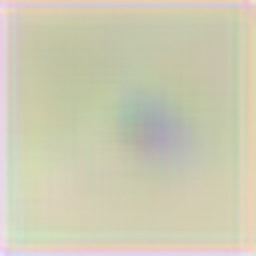

2017-08-03 23:15:32.887447: Step: 45, Generator: 11883.353516


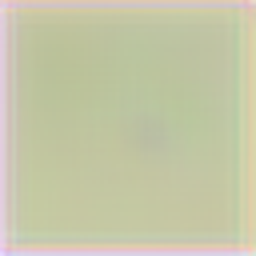

2017-08-03 23:15:39.647376: Step: 46, Generator: 18294.546875


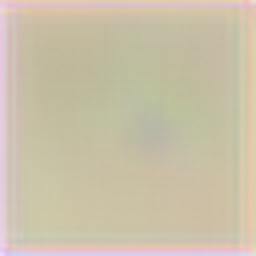

2017-08-03 23:15:46.547058: Step: 47, Generator: 20191.326172


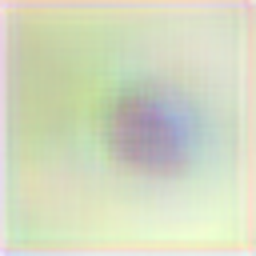

2017-08-03 23:15:53.585076: Step: 48, Generator: 18696.980469


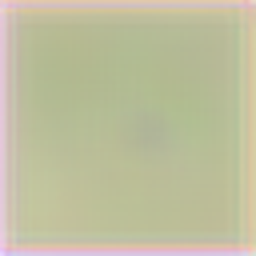

2017-08-03 23:16:00.643824: Step: 49, Generator: 18532.751953


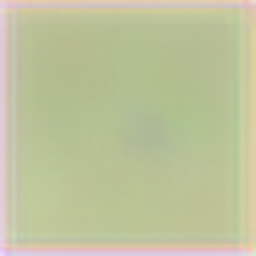

2017-08-03 23:16:07.604077: Step: 50, Generator: 21235.140625


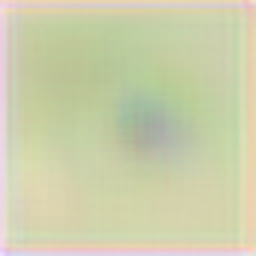

2017-08-03 23:16:14.616037: Step: 51, Generator: 19044.757812


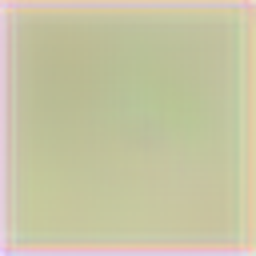

2017-08-03 23:16:23.507745: Step: 52, Generator: 19356.957031


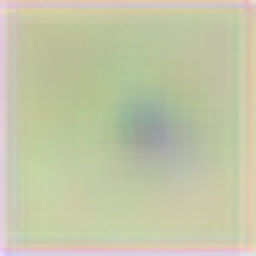

2017-08-03 23:16:31.597392: Step: 53, Generator: 18031.611328


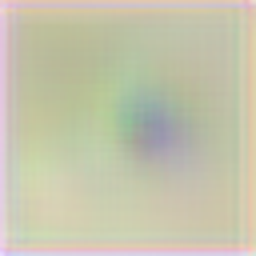

2017-08-03 23:16:38.584789: Step: 54, Generator: 19442.302734


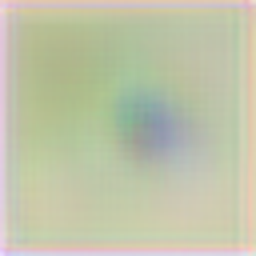

2017-08-03 23:16:45.471319: Step: 55, Generator: 17931.710938


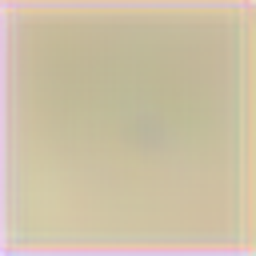

2017-08-03 23:16:52.124968: Step: 56, Generator: 17632.607422


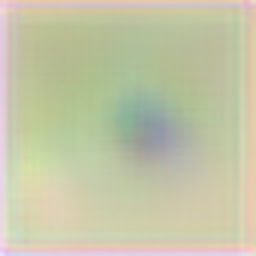

2017-08-03 23:16:59.392970: Step: 57, Generator: 17563.974609


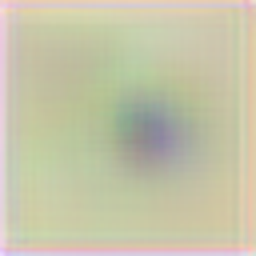

2017-08-03 23:17:06.405299: Step: 58, Generator: 16882.394531


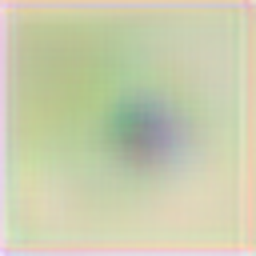

2017-08-03 23:17:13.319195: Step: 59, Generator: 18545.076172


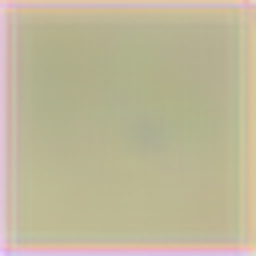

2017-08-03 23:17:20.225243: Step: 60, Generator: 19814.947266


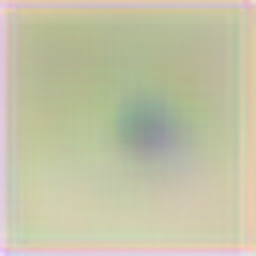

2017-08-03 23:17:26.821244: Step: 61, Generator: 17770.699219


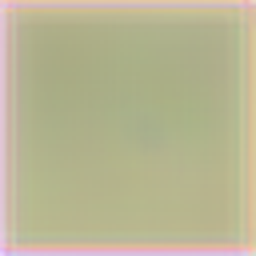

2017-08-03 23:17:33.569393: Step: 62, Generator: 17706.013672


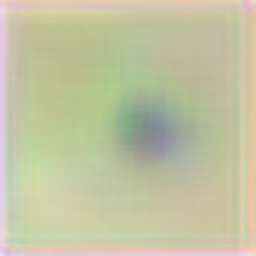

2017-08-03 23:17:40.435516: Step: 63, Generator: 15858.692383


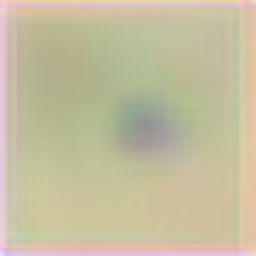

2017-08-03 23:17:47.066326: Step: 64, Generator: 17228.183594


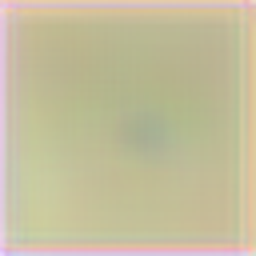

2017-08-03 23:17:53.744525: Step: 65, Generator: 17698.847656


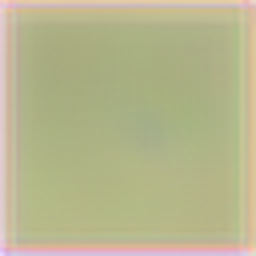

2017-08-03 23:18:00.774286: Step: 66, Generator: 17844.136719


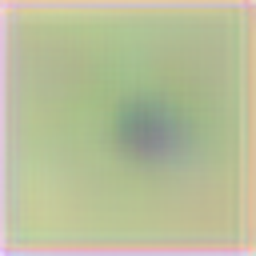

2017-08-03 23:18:07.740023: Step: 67, Generator: 16998.177734


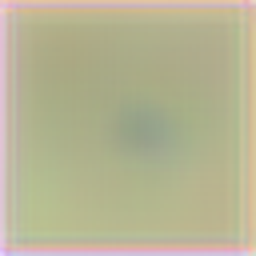

2017-08-03 23:18:14.410106: Step: 68, Generator: 16721.611328


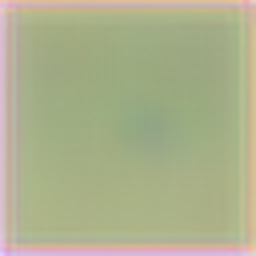

2017-08-03 23:18:21.010374: Step: 69, Generator: 15970.468750


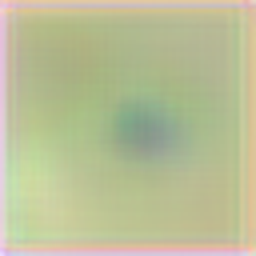

2017-08-03 23:18:27.669133: Step: 70, Generator: 17328.638672


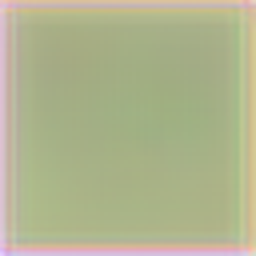

2017-08-03 23:18:34.279161: Step: 71, Generator: 15745.161133


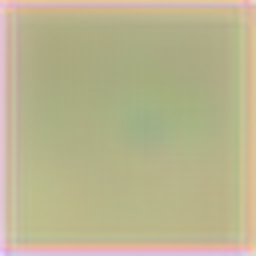

2017-08-03 23:18:43.403367: Step: 72, Generator: 16853.800781


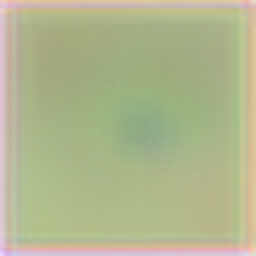

2017-08-03 23:18:50.841498: Step: 73, Generator: 16357.103516


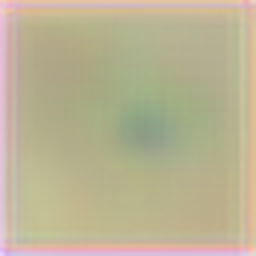

2017-08-03 23:18:57.503839: Step: 74, Generator: 15816.842773


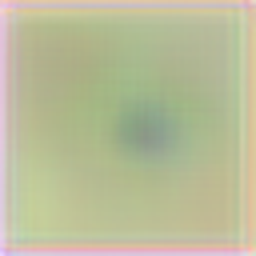

2017-08-03 23:19:04.120628: Step: 75, Generator: 17633.031250


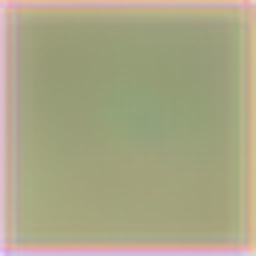

2017-08-03 23:19:10.876594: Step: 76, Generator: 17460.357422


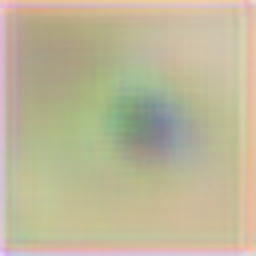

2017-08-03 23:19:17.812244: Step: 77, Generator: 16802.585938


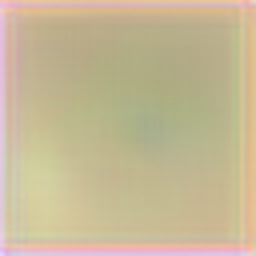

2017-08-03 23:19:24.465479: Step: 78, Generator: 19176.974609


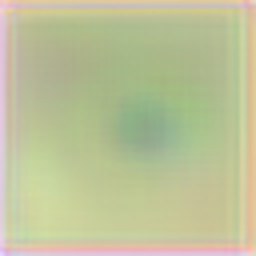

2017-08-03 23:19:31.165460: Step: 79, Generator: 17208.638672


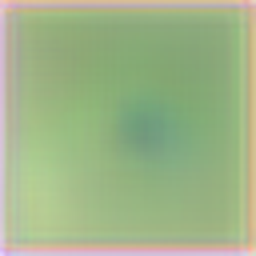

2017-08-03 23:19:37.833267: Step: 80, Generator: 19609.142578


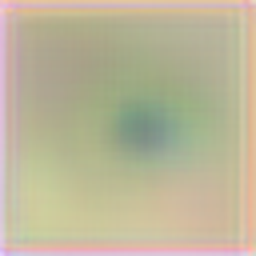

2017-08-03 23:19:44.617114: Step: 81, Generator: 15617.143555


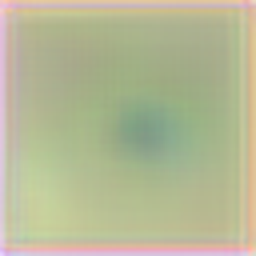

2017-08-03 23:19:51.468583: Step: 82, Generator: 15555.043945


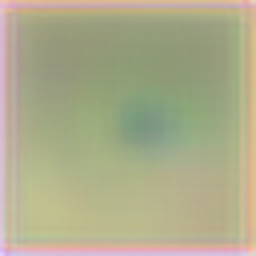

2017-08-03 23:19:58.347279: Step: 83, Generator: 17123.152344


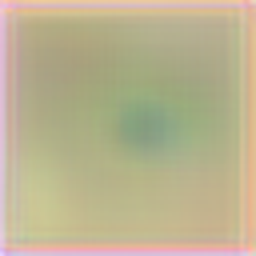

2017-08-03 23:20:05.095387: Step: 84, Generator: 16169.418945


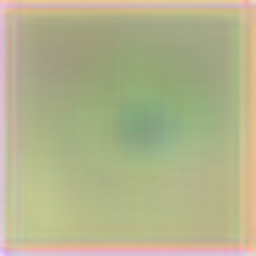

2017-08-03 23:20:11.914823: Step: 85, Generator: 18282.828125


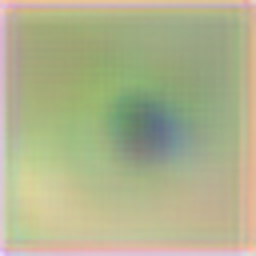

2017-08-03 23:20:18.717137: Step: 86, Generator: 19267.238281


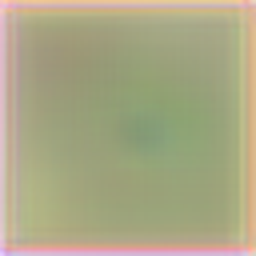

2017-08-03 23:20:25.344391: Step: 87, Generator: 16483.193359


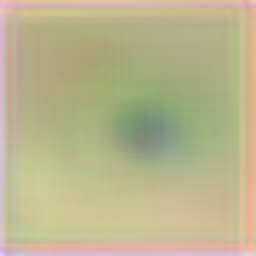

2017-08-03 23:20:31.958206: Step: 88, Generator: 16879.560547


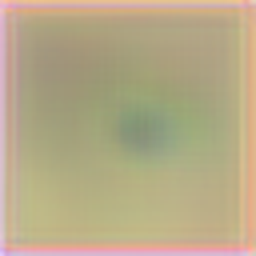

2017-08-03 23:20:38.591606: Step: 89, Generator: 16367.017578


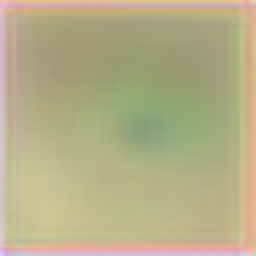

2017-08-03 23:20:45.165095: Step: 90, Generator: 17802.689453


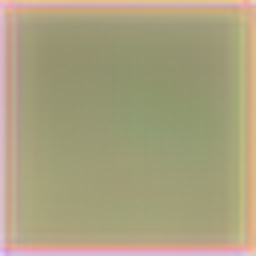

2017-08-03 23:20:48.949931: Step: 91, Generator: 11687.025391


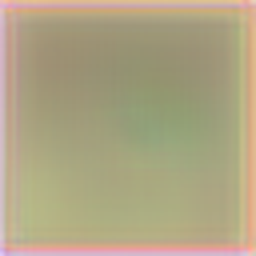

2017-08-03 23:20:55.529313: Step: 92, Generator: 15160.834961


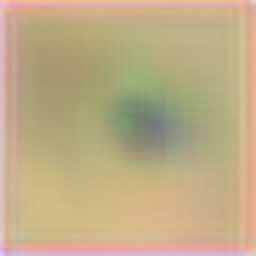

2017-08-03 23:21:02.210527: Step: 93, Generator: 16842.041016


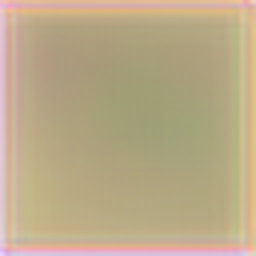

2017-08-03 23:21:11.462332: Step: 94, Generator: 16599.115234


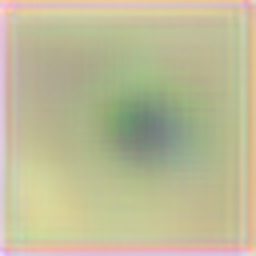

2017-08-03 23:21:18.684502: Step: 95, Generator: 19858.564453


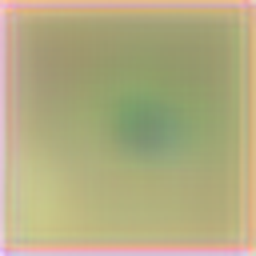

2017-08-03 23:21:25.287079: Step: 96, Generator: 16197.474609


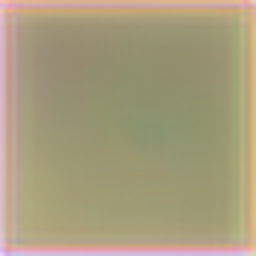

2017-08-03 23:21:31.892704: Step: 97, Generator: 16730.783203


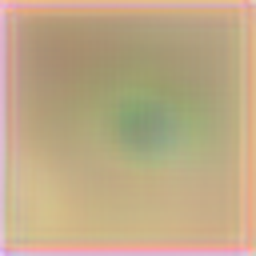

2017-08-03 23:21:38.572772: Step: 98, Generator: 15320.008789


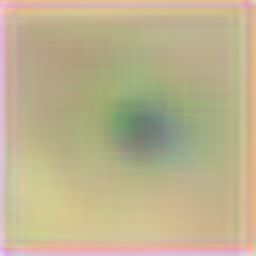

2017-08-03 23:21:45.201435: Step: 99, Generator: 19763.662109


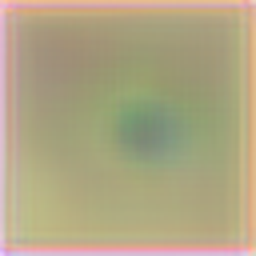

2017-08-03 23:21:51.796944: Step: 100, Generator: 19329.431641


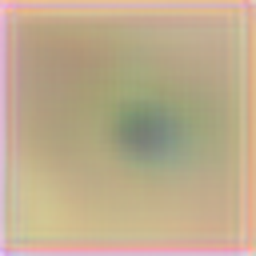

2017-08-03 23:21:59.575340: Step: 101, Generator: 15806.222656


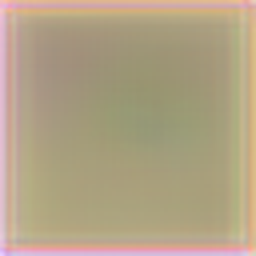

2017-08-03 23:22:06.575396: Step: 102, Generator: 16152.991211


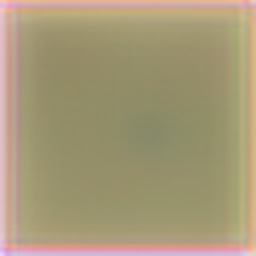

2017-08-03 23:22:13.233099: Step: 103, Generator: 15646.393555


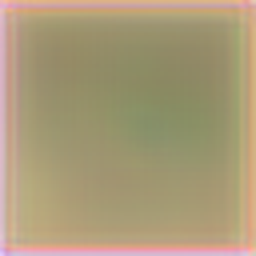

2017-08-03 23:22:19.880013: Step: 104, Generator: 18673.218750


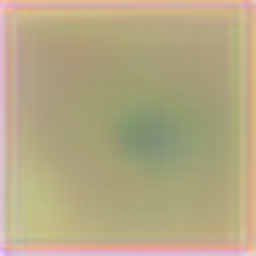

2017-08-03 23:22:26.514013: Step: 105, Generator: 16562.039062


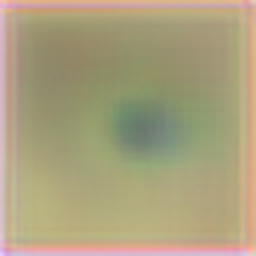

2017-08-03 23:22:33.140036: Step: 106, Generator: 16413.533203


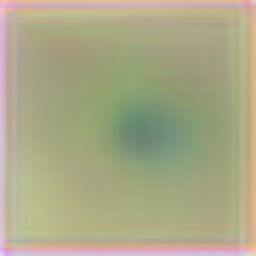

2017-08-03 23:22:39.723854: Step: 107, Generator: 15127.787109


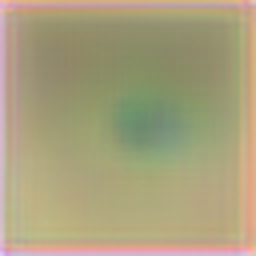

2017-08-03 23:22:46.280002: Step: 108, Generator: 17057.281250


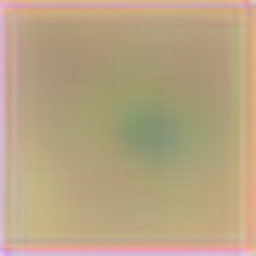

2017-08-03 23:22:52.678727: Step: 109, Generator: 16059.620117


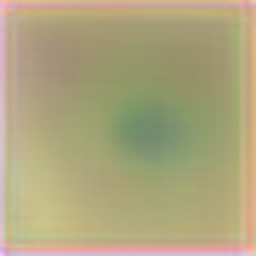

2017-08-03 23:22:59.291399: Step: 110, Generator: 15281.609375


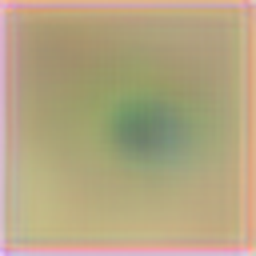

2017-08-03 23:23:05.995070: Step: 111, Generator: 14281.103516


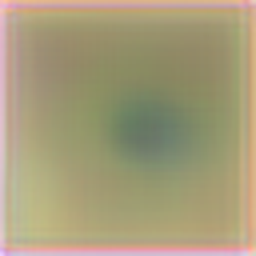

2017-08-03 23:23:12.621949: Step: 112, Generator: 14731.908203


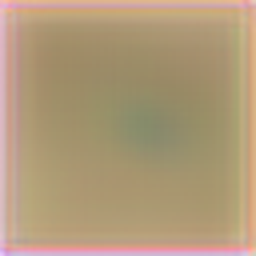

2017-08-03 23:23:19.004271: Step: 113, Generator: 13881.304688


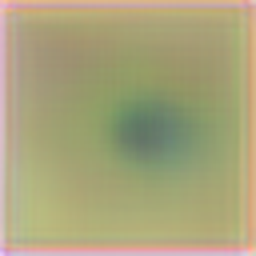

2017-08-03 23:23:25.511473: Step: 114, Generator: 14500.076172


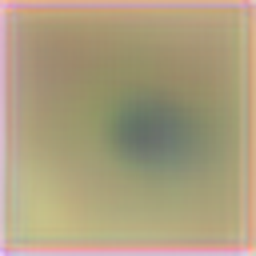

2017-08-03 23:23:32.133219: Step: 115, Generator: 17427.126953


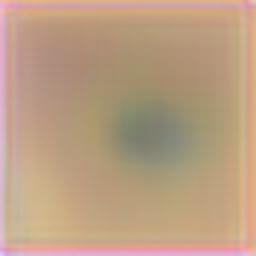

2017-08-03 23:23:41.819322: Step: 116, Generator: 15932.300781


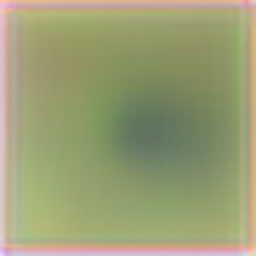

2017-08-03 23:23:49.595999: Step: 117, Generator: 16461.917969


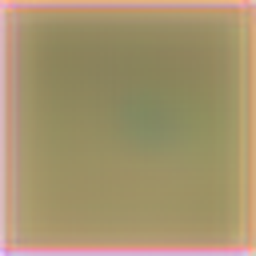

2017-08-03 23:23:56.678591: Step: 118, Generator: 16141.629883


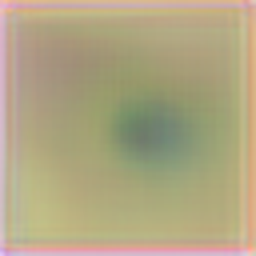

2017-08-03 23:24:03.489804: Step: 119, Generator: 14759.059570


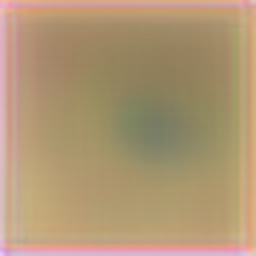

2017-08-03 23:24:10.084851: Step: 120, Generator: 13807.284180


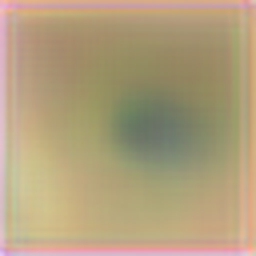

2017-08-03 23:24:16.768484: Step: 121, Generator: 14154.693359


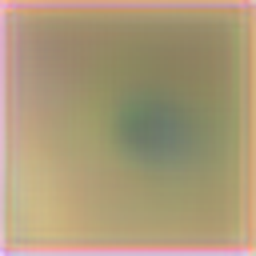

2017-08-03 23:24:23.364847: Step: 122, Generator: 14227.615234


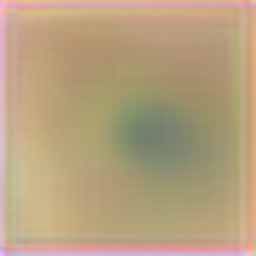

2017-08-03 23:24:29.735372: Step: 123, Generator: 15409.210938


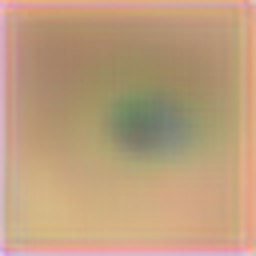

2017-08-03 23:24:36.261081: Step: 124, Generator: 15761.162109


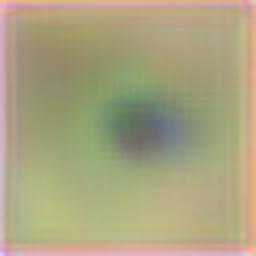

2017-08-03 23:24:42.904149: Step: 125, Generator: 20209.558594


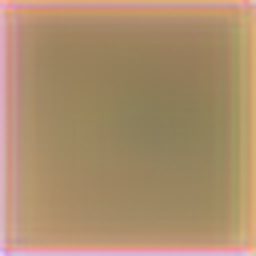

2017-08-03 23:24:49.304880: Step: 126, Generator: 16075.610352


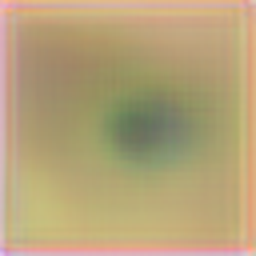

2017-08-03 23:24:55.752324: Step: 127, Generator: 14370.025391


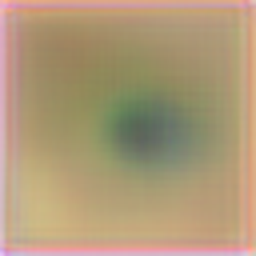

2017-08-03 23:25:02.443799: Step: 128, Generator: 15400.832031


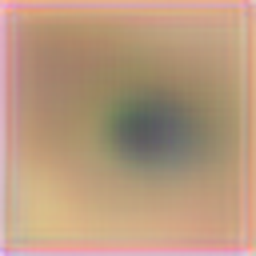

2017-08-03 23:25:08.877749: Step: 129, Generator: 15483.603516


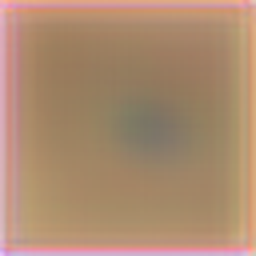

2017-08-03 23:25:15.332912: Step: 130, Generator: 17304.367188


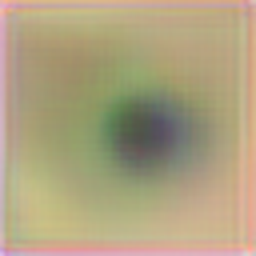

2017-08-03 23:25:22.074503: Step: 131, Generator: 14506.151367


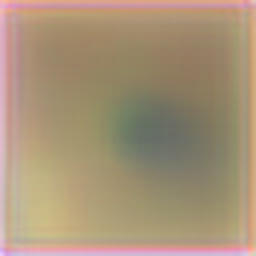

2017-08-03 23:25:28.521223: Step: 132, Generator: 14934.082031


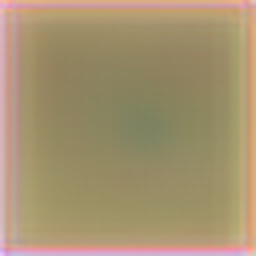

2017-08-03 23:25:35.084329: Step: 133, Generator: 16343.789062


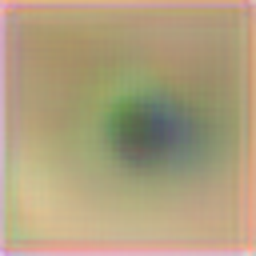

2017-08-03 23:25:41.748077: Step: 134, Generator: 13949.189453


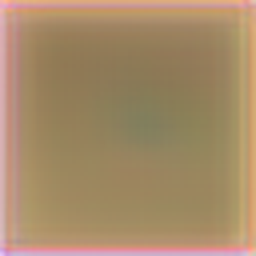

2017-08-03 23:25:48.305373: Step: 135, Generator: 14297.940430


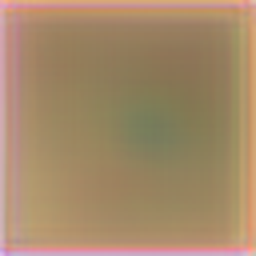

2017-08-03 23:25:54.805918: Step: 136, Generator: 17645.105469


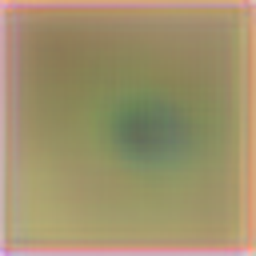

2017-08-03 23:25:58.725093: Step: 137, Generator: 11342.589844


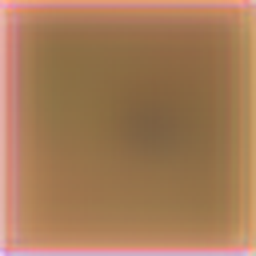

2017-08-03 23:26:07.679209: Step: 138, Generator: 14222.781250


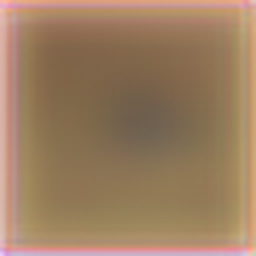

2017-08-03 23:26:14.694544: Step: 139, Generator: 16823.378906


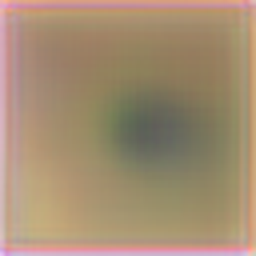

2017-08-03 23:26:21.284820: Step: 140, Generator: 14552.926758


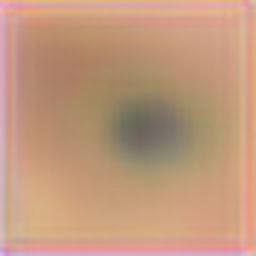

2017-08-03 23:26:27.635732: Step: 141, Generator: 14599.419922


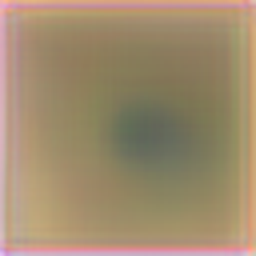

2017-08-03 23:26:34.188221: Step: 142, Generator: 21185.152344


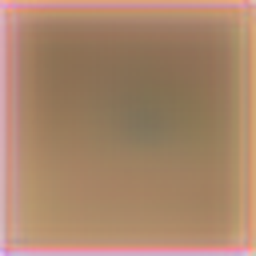

2017-08-03 23:26:40.775587: Step: 143, Generator: 14257.750977


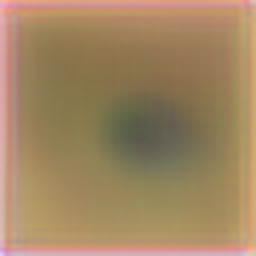

2017-08-03 23:26:47.172132: Step: 144, Generator: 15252.757812


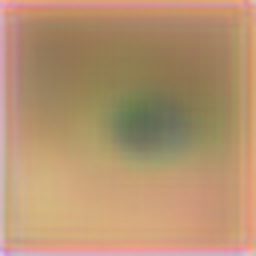

2017-08-03 23:26:53.559795: Step: 145, Generator: 16026.472656


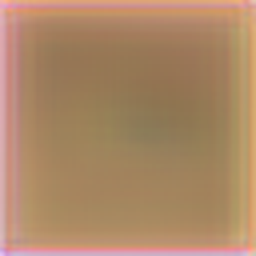

2017-08-03 23:27:00.111372: Step: 146, Generator: 14144.613281


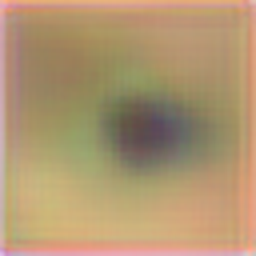

2017-08-03 23:27:06.722131: Step: 147, Generator: 15874.343750


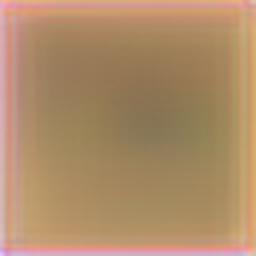

2017-08-03 23:27:13.066241: Step: 148, Generator: 15285.962891


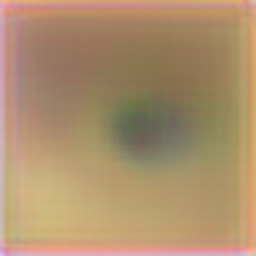

2017-08-03 23:27:19.528228: Step: 149, Generator: 14782.435547


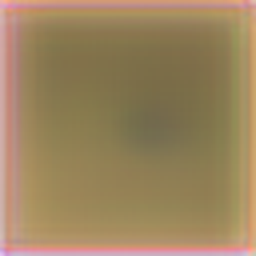

2017-08-03 23:27:26.182970: Step: 150, Generator: 13722.497070


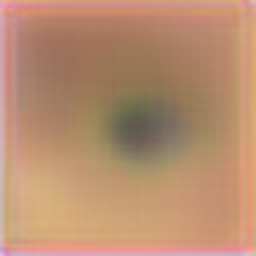

2017-08-03 23:27:32.525142: Step: 151, Generator: 13963.651367


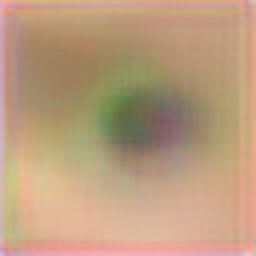

2017-08-03 23:27:38.972387: Step: 152, Generator: 13679.854492


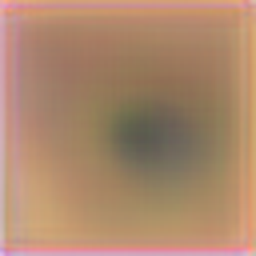

2017-08-03 23:27:45.599776: Step: 153, Generator: 12973.767578


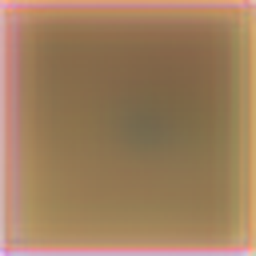

2017-08-03 23:27:51.968479: Step: 154, Generator: 12595.544922


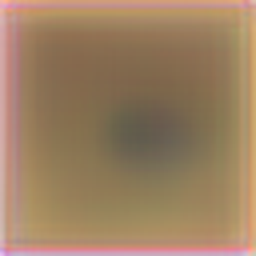

2017-08-03 23:27:58.778656: Step: 155, Generator: 13678.982422


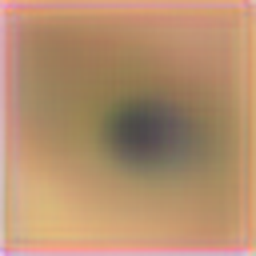

2017-08-03 23:28:05.561080: Step: 156, Generator: 14973.901367


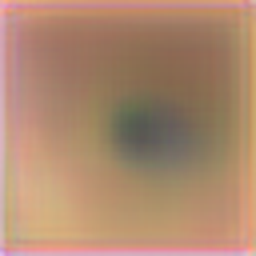

2017-08-03 23:28:11.969657: Step: 157, Generator: 15274.928711


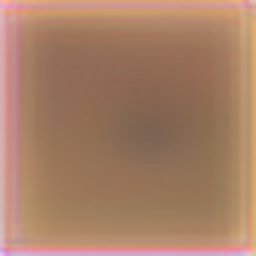

2017-08-03 23:28:18.412474: Step: 158, Generator: 14897.230469


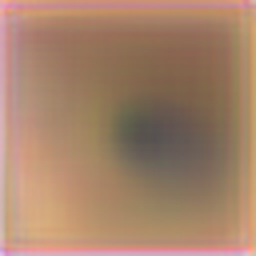

2017-08-03 23:28:25.040263: Step: 159, Generator: 13616.234375


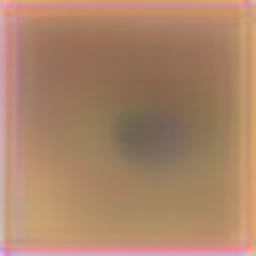

2017-08-03 23:28:31.476119: Step: 160, Generator: 15850.725586


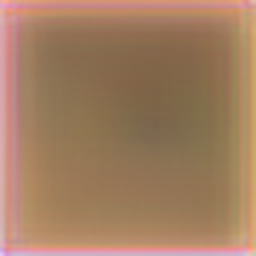

2017-08-03 23:28:37.853851: Step: 161, Generator: 13563.170898


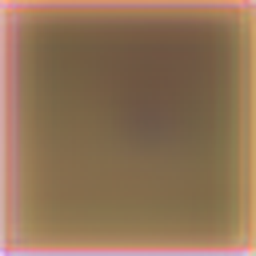

2017-08-03 23:28:44.354533: Step: 162, Generator: 12813.572266


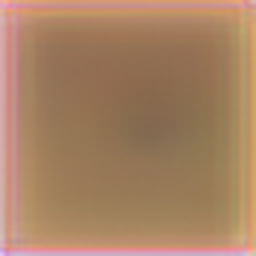

2017-08-03 23:28:51.245462: Step: 163, Generator: 14946.753906


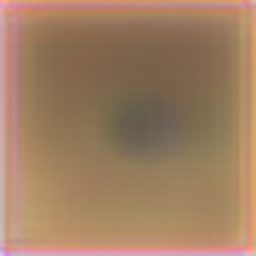

2017-08-03 23:28:57.650554: Step: 164, Generator: 15165.673828


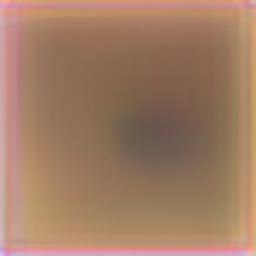

2017-08-03 23:29:04.107275: Step: 165, Generator: 13259.800781


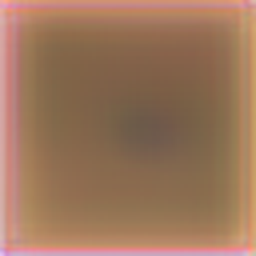

2017-08-03 23:29:10.732467: Step: 166, Generator: 13259.713867


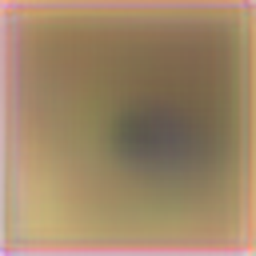

2017-08-03 23:29:17.181122: Step: 167, Generator: 13161.027344


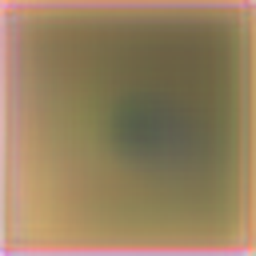

2017-08-03 23:29:23.749098: Step: 168, Generator: 14010.527344


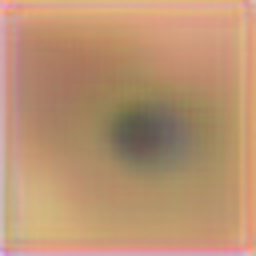

2017-08-03 23:29:33.292333: Step: 169, Generator: 14217.848633


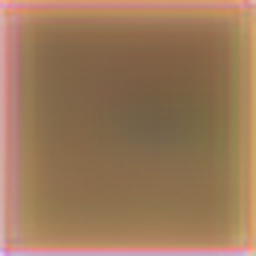

2017-08-03 23:29:45.004157: Step: 170, Generator: 13284.509766


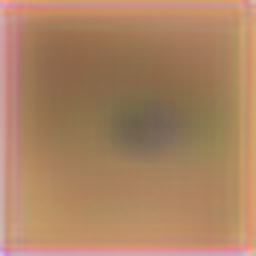

2017-08-03 23:29:51.923528: Step: 171, Generator: 13620.005859


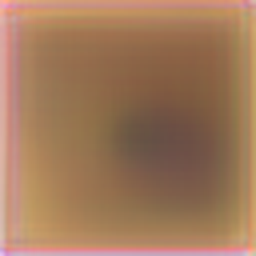

2017-08-03 23:30:00.027440: Step: 172, Generator: 13197.228516


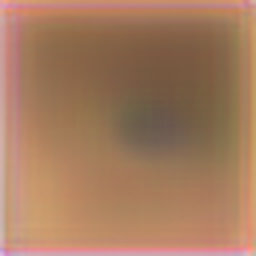

2017-08-03 23:30:07.045333: Step: 173, Generator: 13283.957031


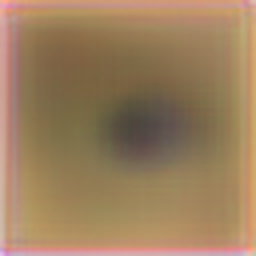

2017-08-03 23:30:13.738783: Step: 174, Generator: 14060.941406


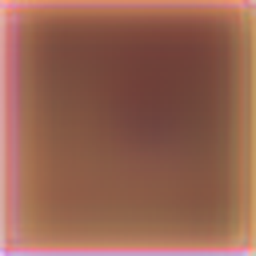

2017-08-03 23:30:20.370363: Step: 175, Generator: 14561.390625


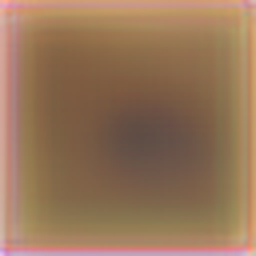

2017-08-03 23:30:27.016484: Step: 176, Generator: 14004.916016


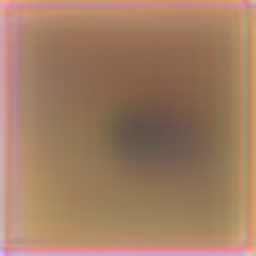

2017-08-03 23:30:33.496936: Step: 177, Generator: 13505.292969


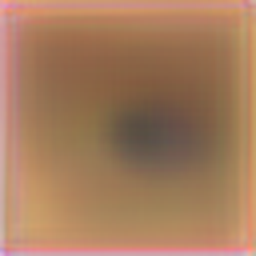

2017-08-03 23:30:40.068423: Step: 178, Generator: 14064.568359


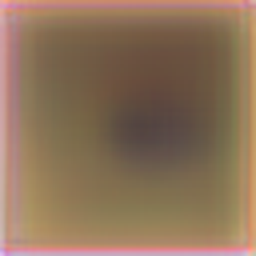

2017-08-03 23:30:46.693553: Step: 179, Generator: 13690.392578


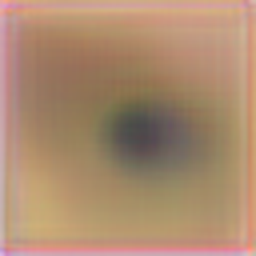

2017-08-03 23:30:53.090159: Step: 180, Generator: 14002.662109


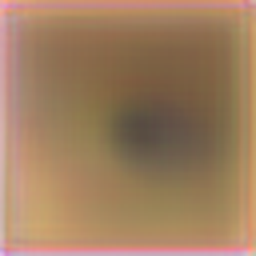

2017-08-03 23:30:59.739524: Step: 181, Generator: 13462.620117


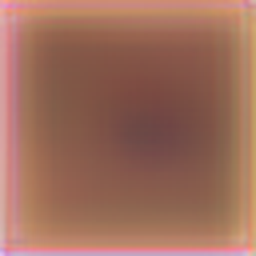

2017-08-03 23:31:06.077608: Step: 182, Generator: 12460.550781


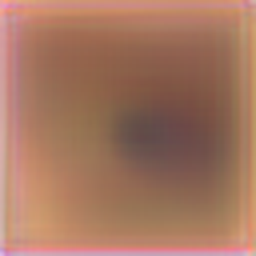

2017-08-03 23:31:09.734235: Step: 183, Generator: 9557.159180


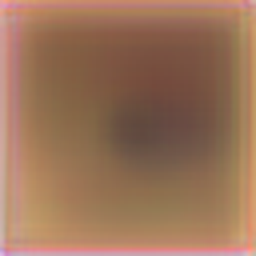

2017-08-03 23:31:16.103873: Step: 184, Generator: 13224.784180


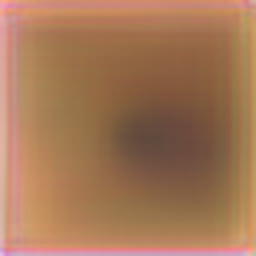

2017-08-03 23:31:22.518193: Step: 185, Generator: 13270.990234


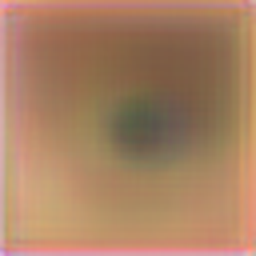

2017-08-03 23:31:28.975907: Step: 186, Generator: 18893.685547


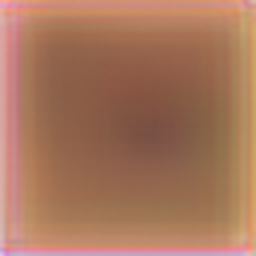

2017-08-03 23:31:35.294880: Step: 187, Generator: 15814.963867


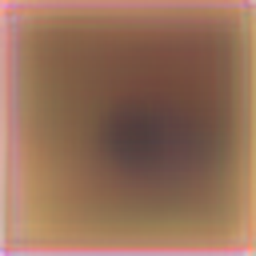

2017-08-03 23:31:41.685418: Step: 188, Generator: 14633.484375


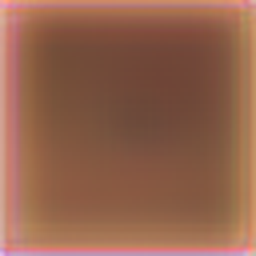

2017-08-03 23:31:47.983306: Step: 189, Generator: 13795.310547


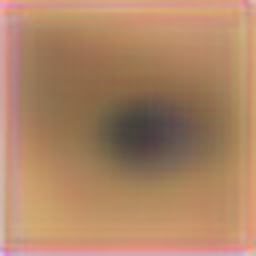

2017-08-03 23:31:54.535626: Step: 190, Generator: 15403.230469


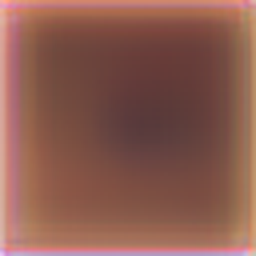

2017-08-03 23:32:01.331392: Step: 191, Generator: 12950.144531


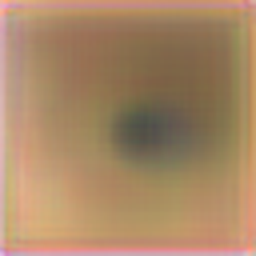

2017-08-03 23:32:07.901433: Step: 192, Generator: 13007.227539


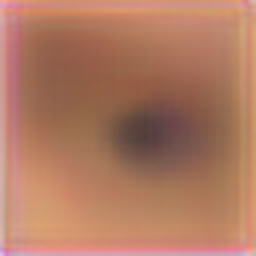

2017-08-03 23:32:14.600198: Step: 193, Generator: 12742.548828


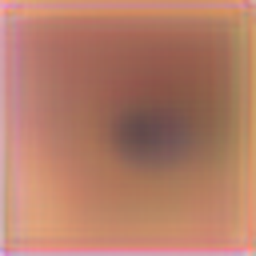

2017-08-03 23:32:21.313427: Step: 194, Generator: 14226.289062


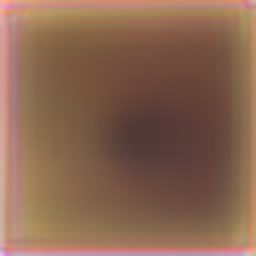

2017-08-03 23:32:27.845055: Step: 195, Generator: 17064.392578


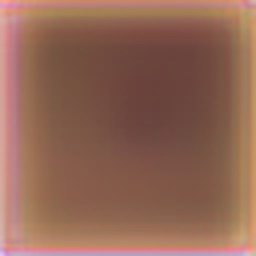

2017-08-03 23:32:34.355080: Step: 196, Generator: 12856.231445


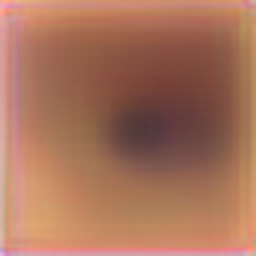

2017-08-03 23:32:40.693374: Step: 197, Generator: 12627.426758


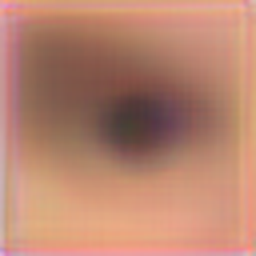

2017-08-03 23:32:47.112656: Step: 198, Generator: 12783.164062


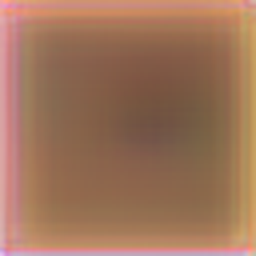

2017-08-03 23:32:53.498237: Step: 199, Generator: 15239.722656


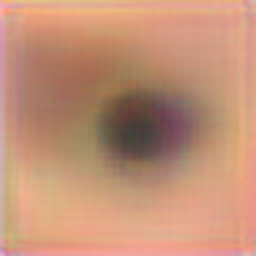

2017-08-03 23:32:59.864024: Step: 200, Generator: 12620.717773


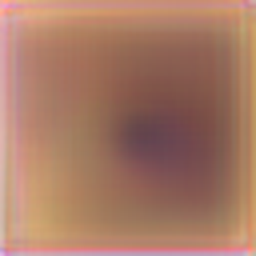

2017-08-03 23:33:06.213521: Step: 201, Generator: 13976.863281


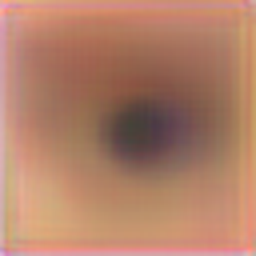

2017-08-03 23:33:12.700339: Step: 202, Generator: 13918.101562


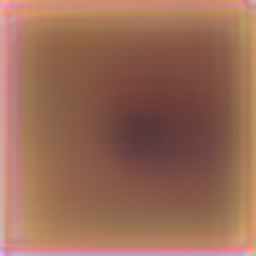

2017-08-03 23:33:19.189805: Step: 203, Generator: 11732.543945


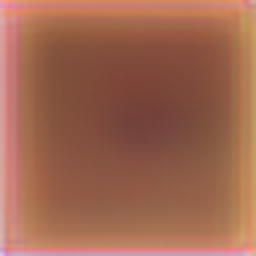

2017-08-03 23:33:25.493415: Step: 204, Generator: 12972.156250


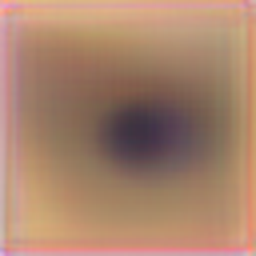

2017-08-03 23:33:31.873292: Step: 205, Generator: 12580.481445


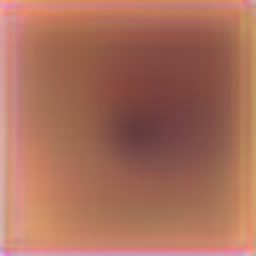

2017-08-03 23:33:38.344313: Step: 206, Generator: 13150.550781


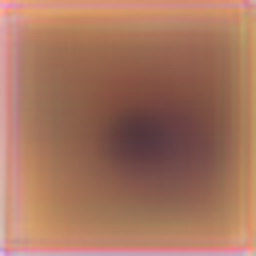

2017-08-03 23:33:44.740249: Step: 207, Generator: 15642.095703


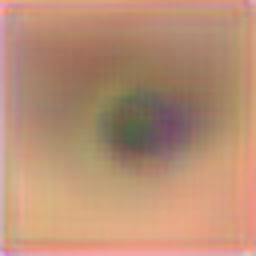

2017-08-03 23:33:51.145294: Step: 208, Generator: 12799.966797


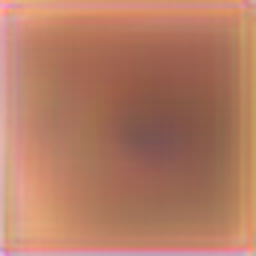

2017-08-03 23:33:57.767399: Step: 209, Generator: 13884.509766


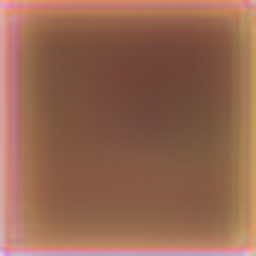

2017-08-03 23:34:04.495549: Step: 210, Generator: 13370.619141


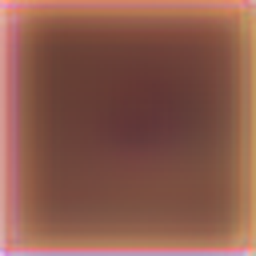

2017-08-03 23:34:11.109750: Step: 211, Generator: 11380.763672


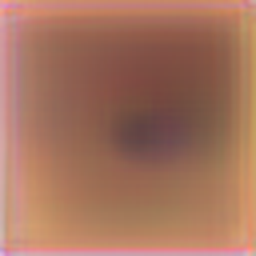

2017-08-03 23:34:17.454260: Step: 212, Generator: 12813.806641


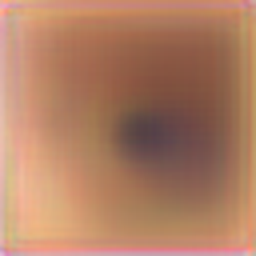

2017-08-03 23:34:23.882599: Step: 213, Generator: 11455.938477


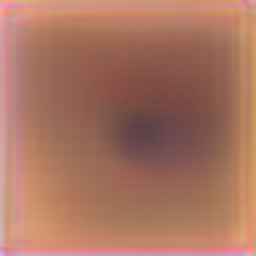

2017-08-03 23:34:30.235520: Step: 214, Generator: 12054.482422


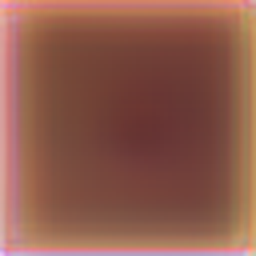

2017-08-03 23:34:36.539021: Step: 215, Generator: 13063.417969


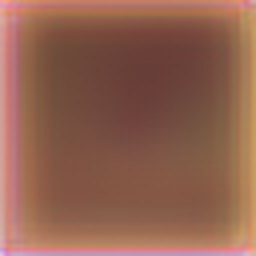

2017-08-03 23:34:42.923581: Step: 216, Generator: 12783.638672


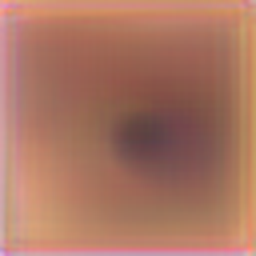

2017-08-03 23:34:49.357589: Step: 217, Generator: 12549.141602


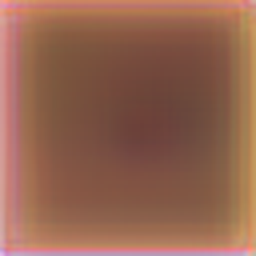

2017-08-03 23:34:55.674104: Step: 218, Generator: 12583.182617


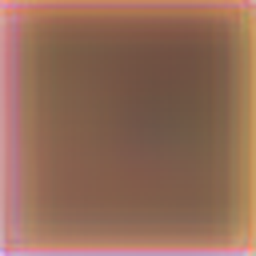

2017-08-03 23:35:01.959142: Step: 219, Generator: 13683.738281


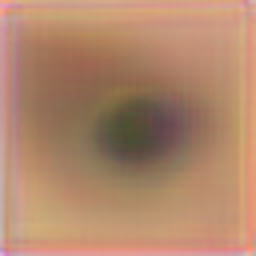

2017-08-03 23:35:08.245501: Step: 220, Generator: 14982.617188


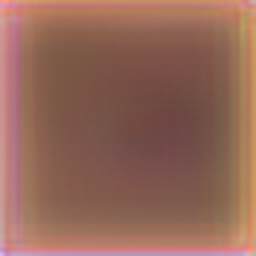

2017-08-03 23:35:14.621697: Step: 221, Generator: 15898.492188


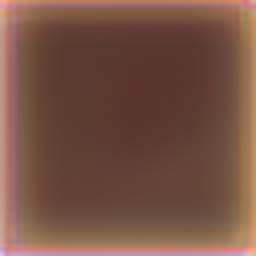

2017-08-03 23:35:21.026073: Step: 222, Generator: 12717.087891


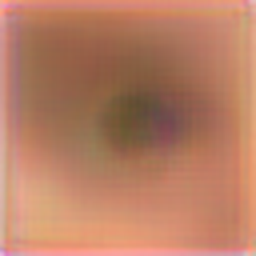

2017-08-03 23:35:27.485112: Step: 223, Generator: 14772.394531


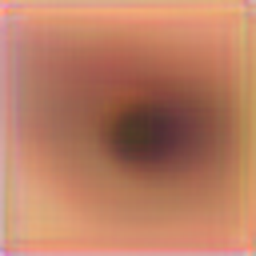

2017-08-03 23:35:34.103388: Step: 224, Generator: 15834.869141


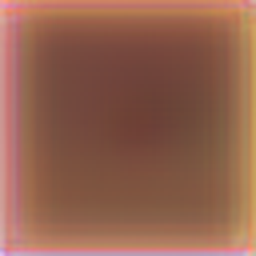

2017-08-03 23:35:40.555598: Step: 225, Generator: 13750.726562


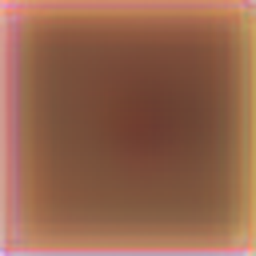

2017-08-03 23:35:46.907591: Step: 226, Generator: 11881.476562


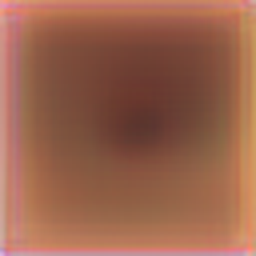

2017-08-03 23:35:53.460729: Step: 227, Generator: 15009.226562


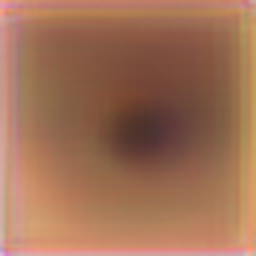

2017-08-03 23:36:00.288735: Step: 228, Generator: 13717.744141


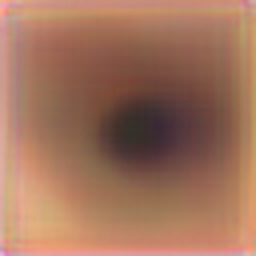

2017-08-03 23:36:04.129728: Step: 229, Generator: 7121.075195


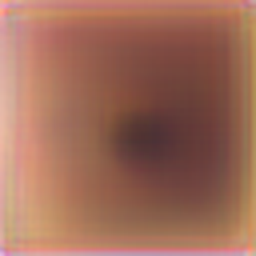

2017-08-03 23:36:10.506282: Step: 230, Generator: 14509.494141


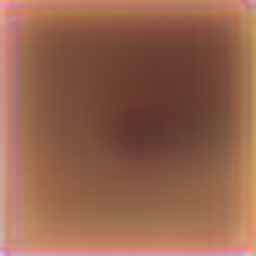

2017-08-03 23:36:16.819476: Step: 231, Generator: 12372.984375


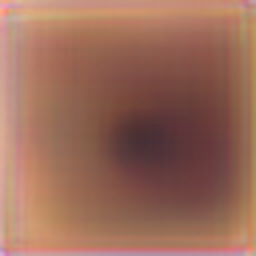

2017-08-03 23:36:23.211555: Step: 232, Generator: 12485.435547


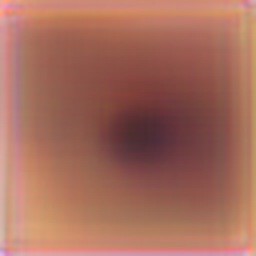

2017-08-03 23:36:29.718417: Step: 233, Generator: 16228.187500


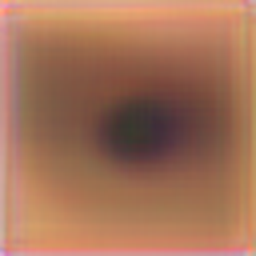

2017-08-03 23:36:36.281348: Step: 234, Generator: 12276.236328


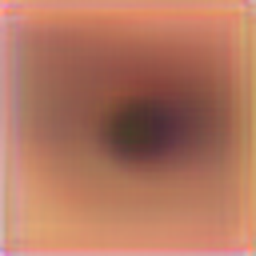

2017-08-03 23:36:42.660097: Step: 235, Generator: 11377.750000


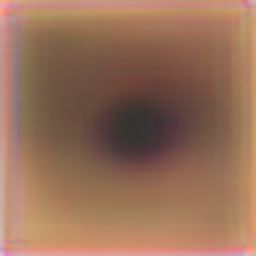

2017-08-03 23:36:49.013843: Step: 236, Generator: 11723.108398


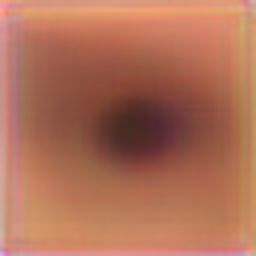

2017-08-03 23:36:55.827393: Step: 237, Generator: 13258.152344


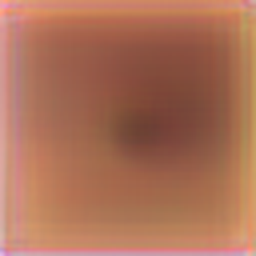

2017-08-03 23:37:02.553198: Step: 238, Generator: 14779.488281


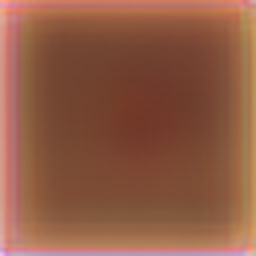

2017-08-03 23:37:08.958829: Step: 239, Generator: 12011.553711


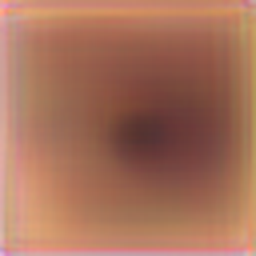

2017-08-03 23:37:15.444708: Step: 240, Generator: 14408.680664


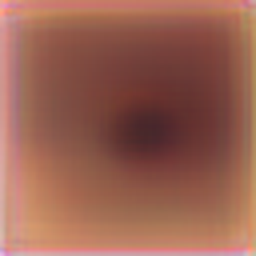

2017-08-03 23:37:23.636949: Step: 241, Generator: 12843.423828


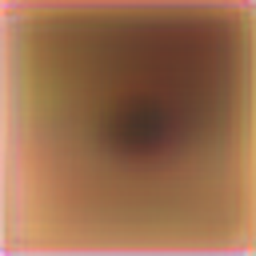

2017-08-03 23:37:32.013081: Step: 242, Generator: 12493.930664


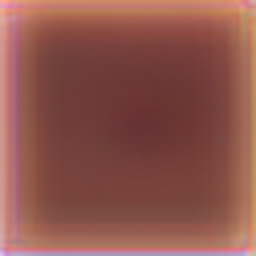

2017-08-03 23:37:38.691946: Step: 243, Generator: 12321.980469


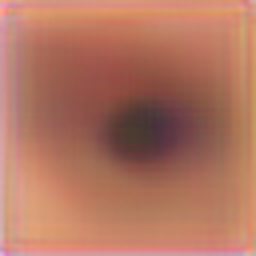

2017-08-03 23:37:45.118742: Step: 244, Generator: 12308.466797


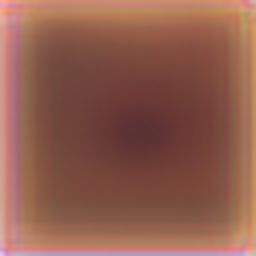

2017-08-03 23:37:51.552489: Step: 245, Generator: 11437.984375


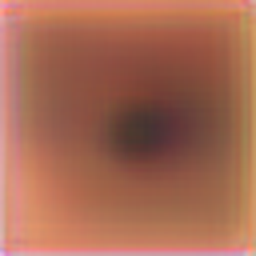

2017-08-03 23:37:58.681971: Step: 246, Generator: 13106.353516


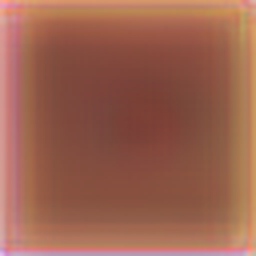

2017-08-03 23:38:05.504497: Step: 247, Generator: 13410.166992


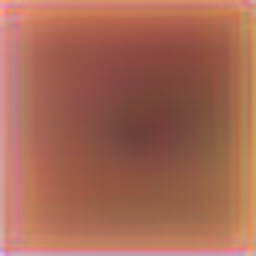

2017-08-03 23:38:11.907935: Step: 248, Generator: 13561.546875


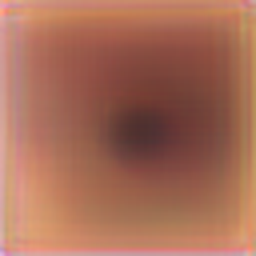

2017-08-03 23:38:18.331929: Step: 249, Generator: 18306.310547


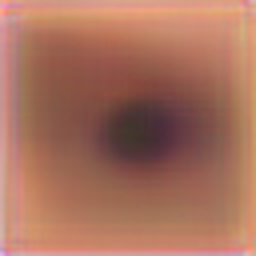

2017-08-03 23:38:24.738722: Step: 250, Generator: 11601.039062


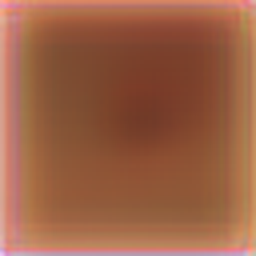

2017-08-03 23:38:31.286252: Step: 251, Generator: 12701.174805


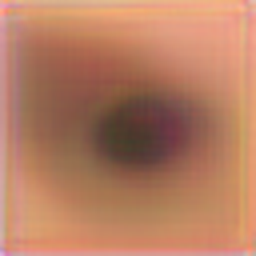

2017-08-03 23:38:37.769688: Step: 252, Generator: 13363.314453


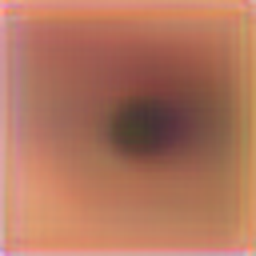

2017-08-03 23:38:44.117410: Step: 253, Generator: 12996.705078


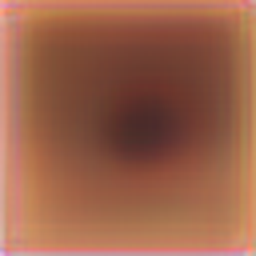

2017-08-03 23:38:50.484504: Step: 254, Generator: 11919.212891


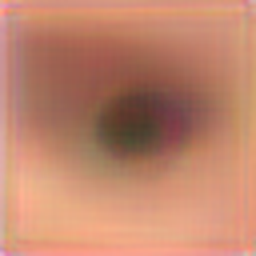

2017-08-03 23:38:56.865694: Step: 255, Generator: 12456.583008


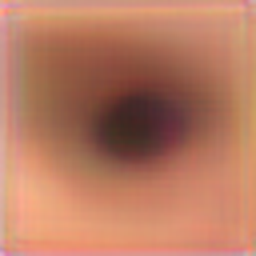

2017-08-03 23:39:04.036759: Step: 256, Generator: 12903.528320


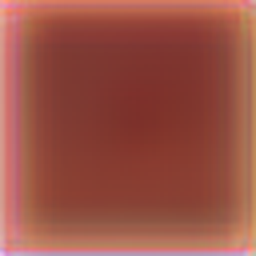

2017-08-03 23:39:10.451673: Step: 257, Generator: 11570.431641


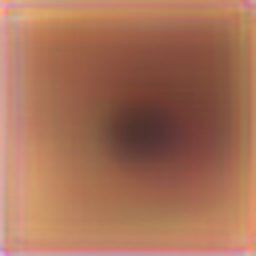

2017-08-03 23:39:16.907433: Step: 258, Generator: 11751.023438


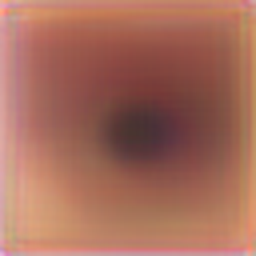

2017-08-03 23:39:23.578613: Step: 259, Generator: 13761.866211


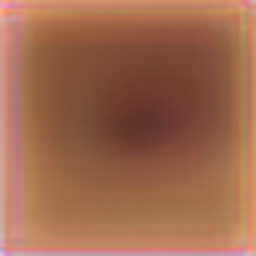

2017-08-03 23:39:30.183586: Step: 260, Generator: 10804.773438


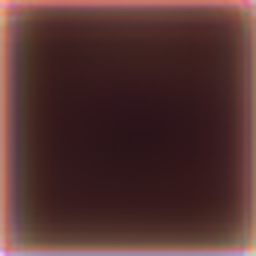

2017-08-03 23:39:36.593887: Step: 261, Generator: 13889.765625


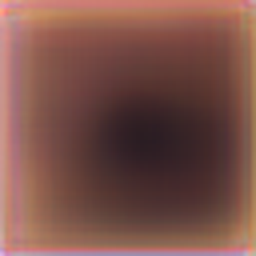

2017-08-03 23:39:43.104075: Step: 262, Generator: 13877.914062


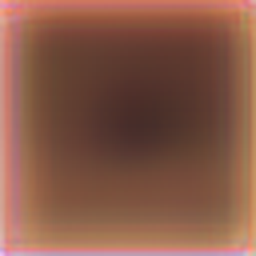

2017-08-03 23:39:49.447430: Step: 263, Generator: 12907.656250


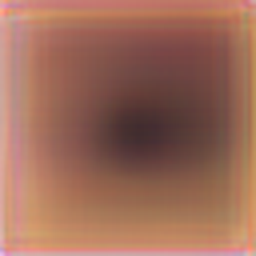

2017-08-03 23:39:56.163595: Step: 264, Generator: 12119.198242


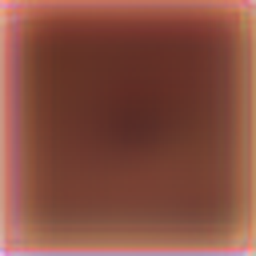

2017-08-03 23:40:02.760631: Step: 265, Generator: 14066.632812


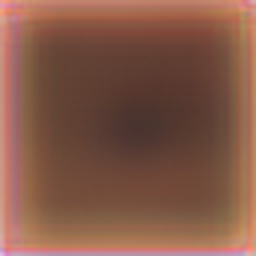

2017-08-03 23:40:09.264598: Step: 266, Generator: 14337.143555


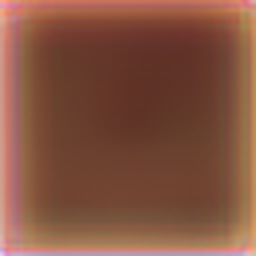

2017-08-03 23:40:15.852594: Step: 267, Generator: 12735.518555


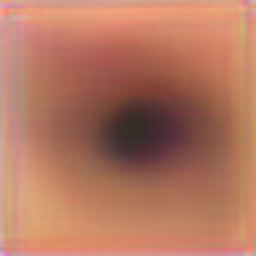

2017-08-03 23:40:23.983663: Step: 268, Generator: 11304.464844


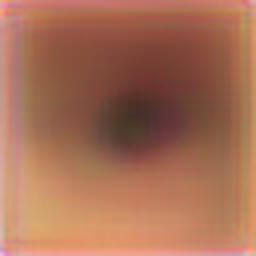

2017-08-03 23:40:32.777264: Step: 269, Generator: 12748.113281


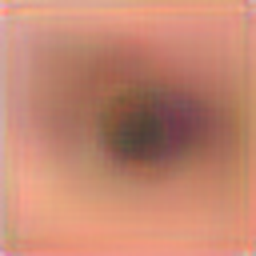

2017-08-03 23:40:41.269151: Step: 270, Generator: 11938.260742


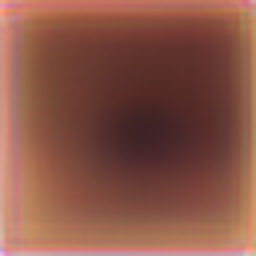

2017-08-03 23:40:48.760149: Step: 271, Generator: 12725.580078


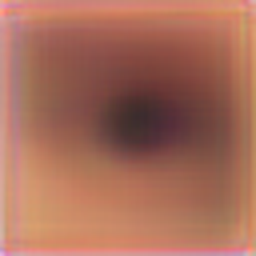

2017-08-03 23:40:56.896709: Step: 272, Generator: 11173.099609


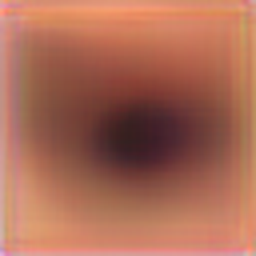

2017-08-03 23:41:06.401986: Step: 273, Generator: 11940.631836


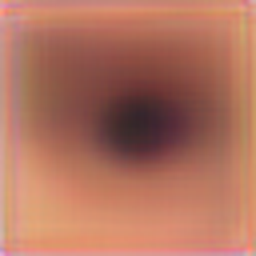

2017-08-03 23:41:14.568423: Step: 274, Generator: 11589.365234


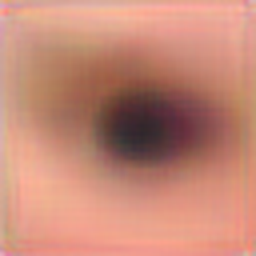

2017-08-03 23:41:18.857603: Step: 275, Generator: 12711.169922


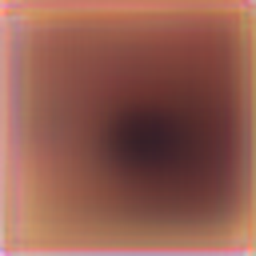

2017-08-03 23:41:26.577138: Step: 276, Generator: 10610.302734


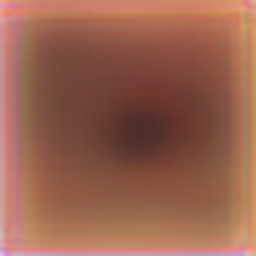

2017-08-03 23:41:34.534333: Step: 277, Generator: 12977.509766


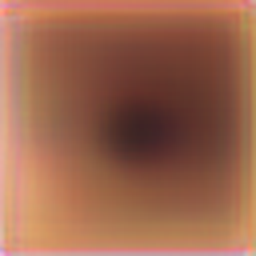

2017-08-03 23:41:43.100444: Step: 278, Generator: 13638.332031


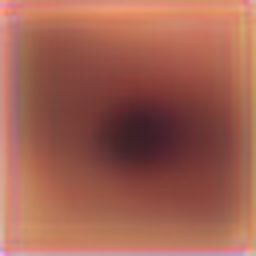

2017-08-03 23:41:50.390769: Step: 279, Generator: 13005.287109


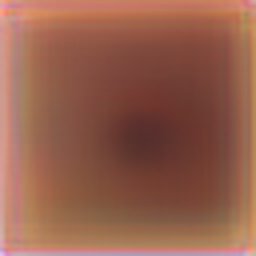

2017-08-03 23:41:57.624072: Step: 280, Generator: 14272.058594


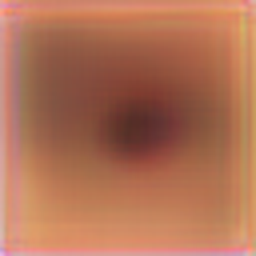

2017-08-03 23:42:04.376685: Step: 281, Generator: 15771.835938


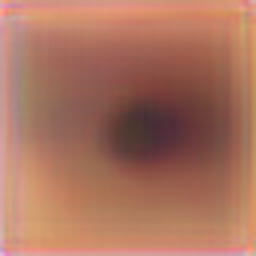

2017-08-03 23:42:12.081626: Step: 282, Generator: 13207.209961


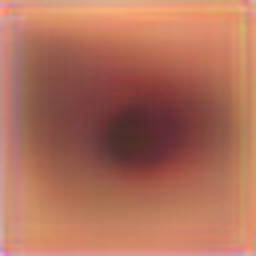

2017-08-03 23:42:19.732163: Step: 283, Generator: 11892.499023


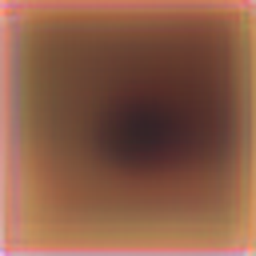

2017-08-03 23:42:27.154245: Step: 284, Generator: 13522.342773


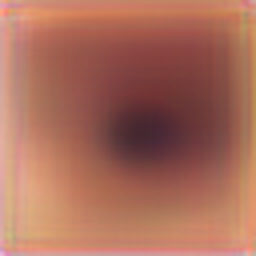

2017-08-03 23:42:34.127723: Step: 285, Generator: 12237.626953


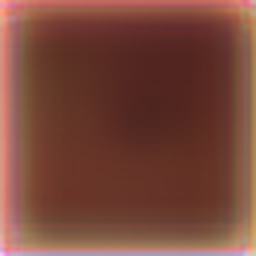

2017-08-03 23:42:40.994579: Step: 286, Generator: 11842.003906


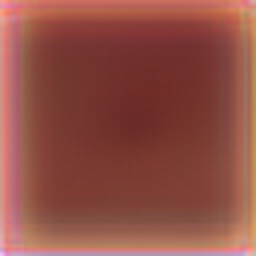

2017-08-03 23:42:48.003738: Step: 287, Generator: 10947.468750


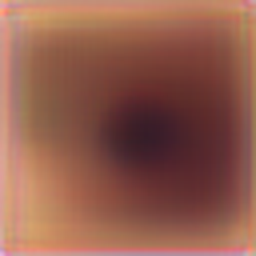

2017-08-03 23:42:54.956922: Step: 288, Generator: 11859.784180


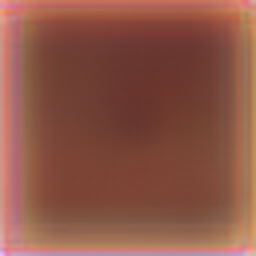

2017-08-03 23:43:02.041165: Step: 289, Generator: 11732.911133


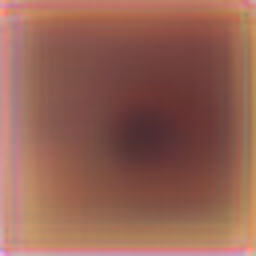

2017-08-03 23:43:08.841836: Step: 290, Generator: 13309.572266


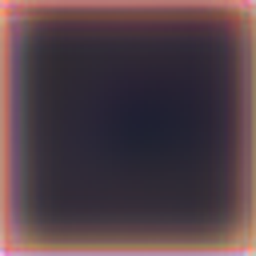

2017-08-03 23:43:15.660123: Step: 291, Generator: 13348.648438


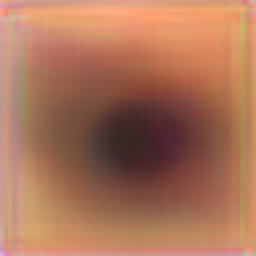

2017-08-03 23:43:22.727527: Step: 292, Generator: 11195.491211


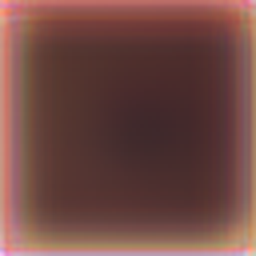

2017-08-03 23:43:30.075790: Step: 293, Generator: 12364.177734


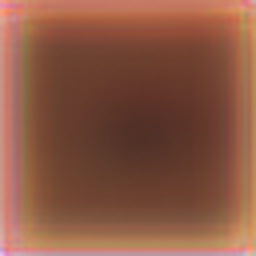

2017-08-03 23:43:37.123845: Step: 294, Generator: 11022.905273


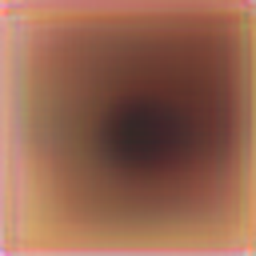

2017-08-03 23:43:44.083669: Step: 295, Generator: 11137.651367


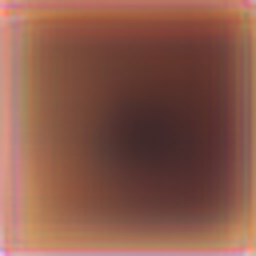

2017-08-03 23:43:50.891538: Step: 296, Generator: 11309.887695


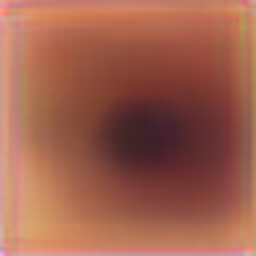

2017-08-03 23:43:58.481658: Step: 297, Generator: 14311.678711


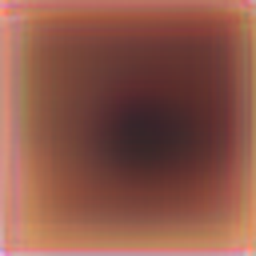

2017-08-03 23:44:06.046331: Step: 298, Generator: 11861.797852


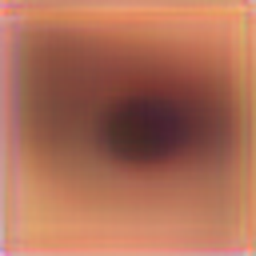

2017-08-03 23:44:16.967037: Step: 299, Generator: 11075.915039


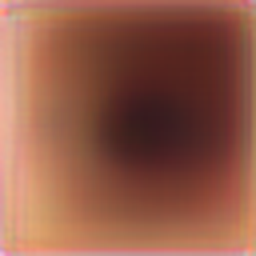

2017-08-03 23:44:24.602458: Step: 300, Generator: 12139.129883


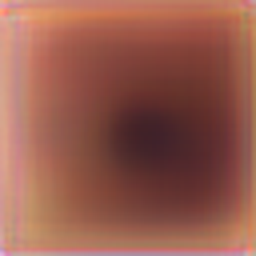

2017-08-03 23:44:31.940435: Step: 301, Generator: 11820.870117


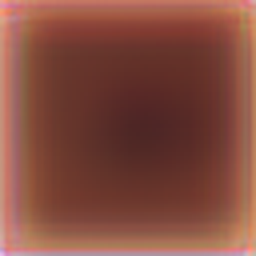

2017-08-03 23:44:40.415443: Step: 302, Generator: 11265.479492


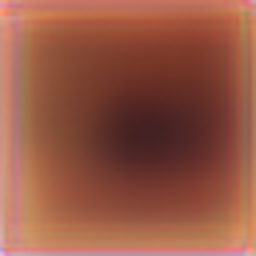

2017-08-03 23:44:48.602064: Step: 303, Generator: 11269.078125


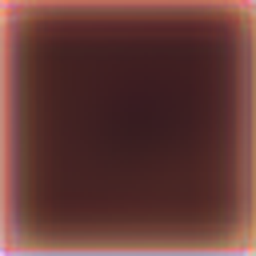

2017-08-03 23:44:57.044363: Step: 304, Generator: 10350.687500


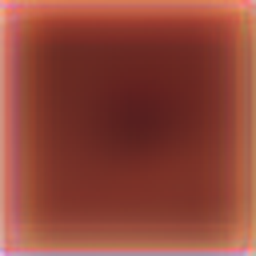

2017-08-03 23:45:04.904837: Step: 305, Generator: 13615.515625


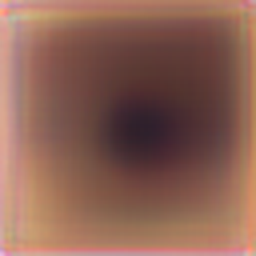

2017-08-03 23:45:12.014018: Step: 306, Generator: 11087.075195


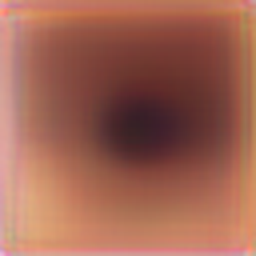

2017-08-03 23:45:18.759369: Step: 307, Generator: 10875.234375


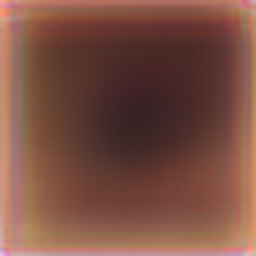

2017-08-03 23:45:25.785088: Step: 308, Generator: 13461.964844


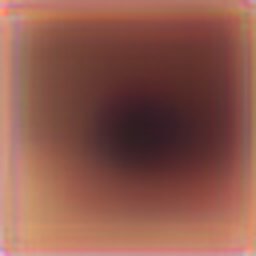

2017-08-03 23:45:33.066382: Step: 309, Generator: 11760.851562


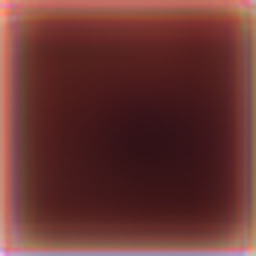

2017-08-03 23:45:40.170213: Step: 310, Generator: 15373.218750


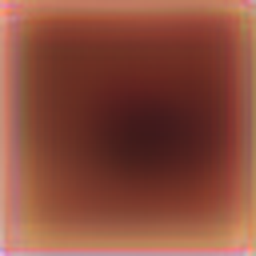

2017-08-03 23:45:47.311275: Step: 311, Generator: 12025.343750


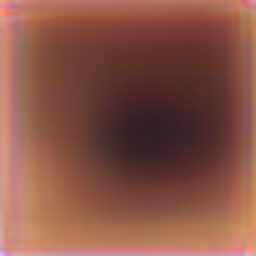

2017-08-03 23:45:54.527121: Step: 312, Generator: 13938.075195


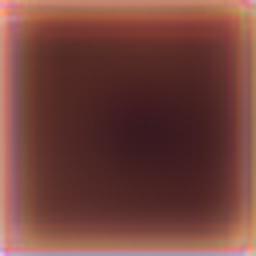

2017-08-03 23:46:01.697736: Step: 313, Generator: 11936.943359


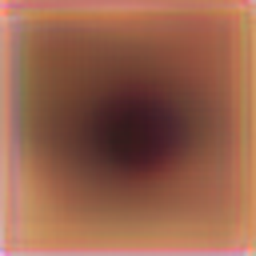

2017-08-03 23:46:08.653797: Step: 314, Generator: 13013.037109


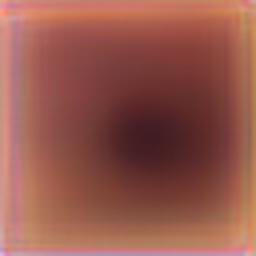

2017-08-03 23:46:15.431185: Step: 315, Generator: 12518.219727


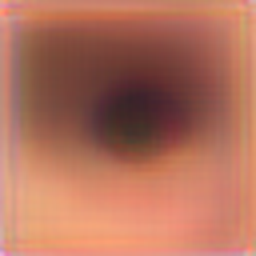

2017-08-03 23:46:22.376863: Step: 316, Generator: 12460.571289


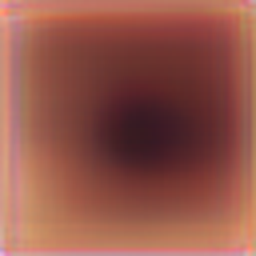

2017-08-03 23:46:29.014026: Step: 317, Generator: 13668.583984


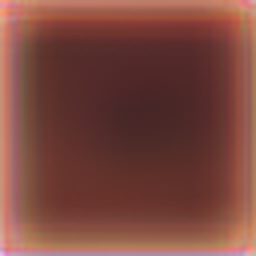

2017-08-03 23:46:35.725426: Step: 318, Generator: 13124.585938


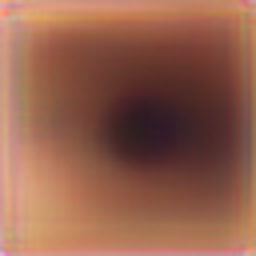

2017-08-03 23:46:42.577631: Step: 319, Generator: 12097.314453


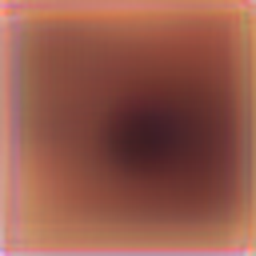

2017-08-03 23:46:49.193533: Step: 320, Generator: 11280.680664


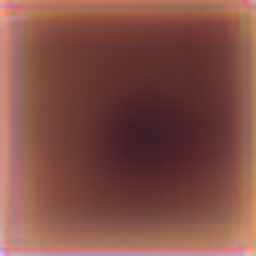

2017-08-03 23:46:53.032430: Step: 321, Generator: 6129.224609


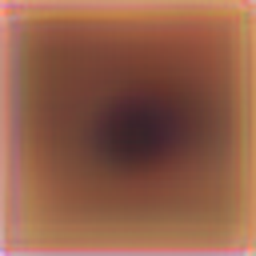

2017-08-03 23:47:00.201006: Step: 322, Generator: 11719.738281


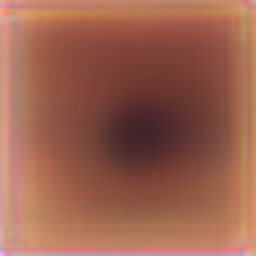

2017-08-03 23:47:06.968114: Step: 323, Generator: 12102.074219


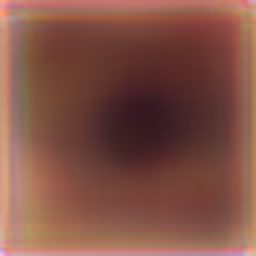

2017-08-03 23:47:13.734246: Step: 324, Generator: 13542.568359


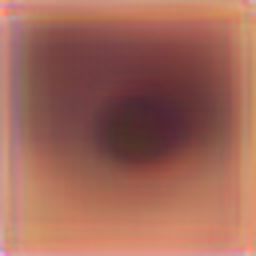

2017-08-03 23:47:20.327869: Step: 325, Generator: 13085.616211


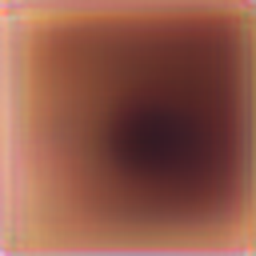

2017-08-03 23:47:27.004379: Step: 326, Generator: 12037.141602


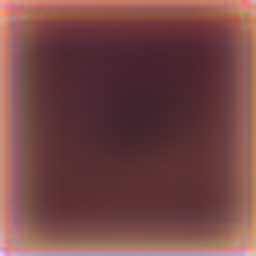

2017-08-03 23:47:33.381369: Step: 327, Generator: 11638.253906


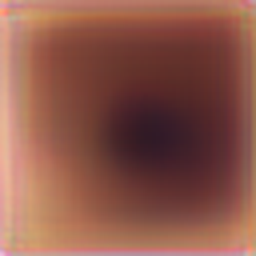

2017-08-03 23:47:39.924125: Step: 328, Generator: 12401.674805


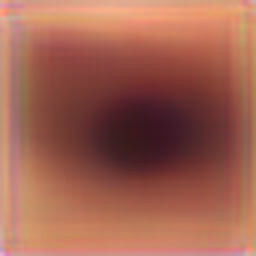

2017-08-03 23:47:46.649349: Step: 329, Generator: 14153.293945


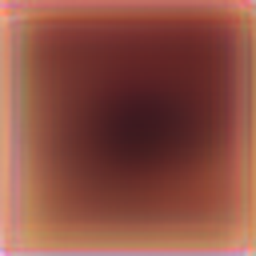

2017-08-03 23:47:53.221003: Step: 330, Generator: 11542.207031


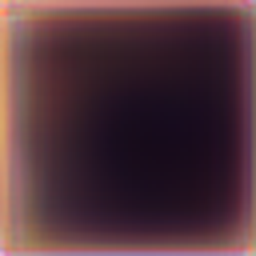

2017-08-03 23:48:00.104653: Step: 331, Generator: 14038.783203


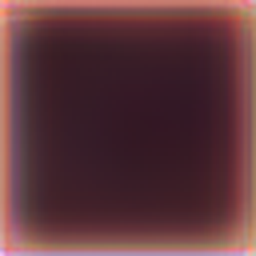

2017-08-03 23:48:06.824598: Step: 332, Generator: 14964.656250


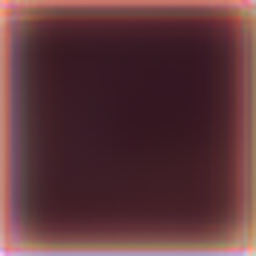

2017-08-03 23:48:13.173911: Step: 333, Generator: 10757.663086


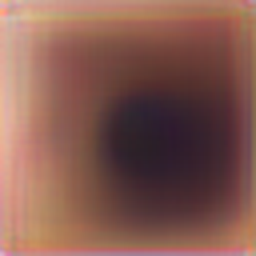

2017-08-03 23:48:19.516107: Step: 334, Generator: 10743.520508


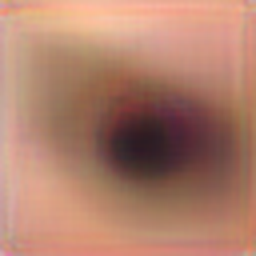

2017-08-03 23:48:25.910018: Step: 335, Generator: 12965.165039


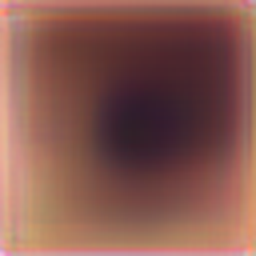

2017-08-03 23:48:32.452876: Step: 336, Generator: 10729.659180


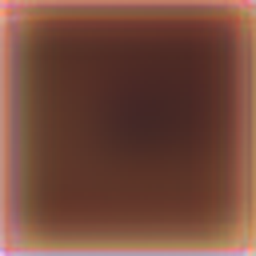

2017-08-03 23:48:38.828256: Step: 337, Generator: 11883.246094


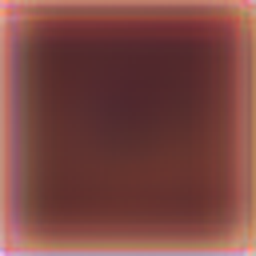

2017-08-03 23:48:45.212713: Step: 338, Generator: 12382.551758


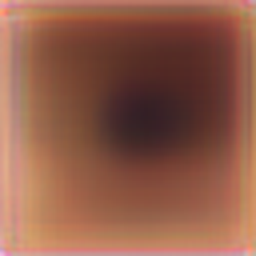

2017-08-03 23:48:51.604572: Step: 339, Generator: 11446.882812


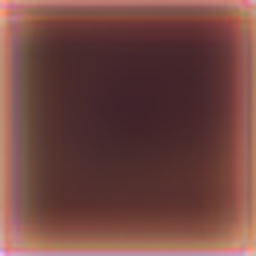

2017-08-03 23:48:57.952980: Step: 340, Generator: 12925.349609


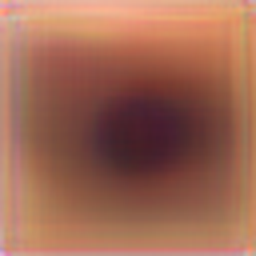

2017-08-03 23:49:04.357874: Step: 341, Generator: 12046.112305


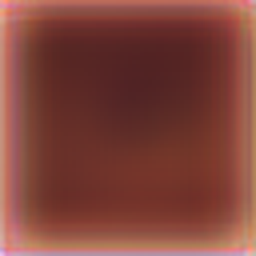

2017-08-03 23:49:10.582973: Step: 342, Generator: 13536.832031


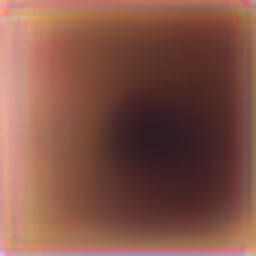

2017-08-03 23:49:16.972944: Step: 343, Generator: 13345.925781


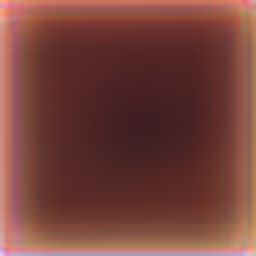

2017-08-03 23:49:23.311849: Step: 344, Generator: 10143.461914


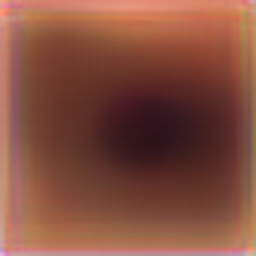

2017-08-03 23:49:29.796230: Step: 345, Generator: 11751.310547


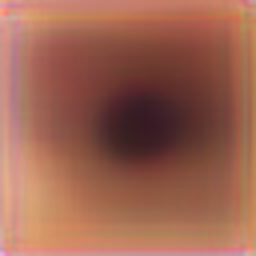

2017-08-03 23:49:36.256504: Step: 346, Generator: 12687.068359


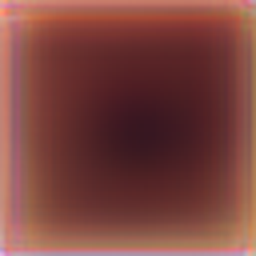

2017-08-03 23:49:42.461208: Step: 347, Generator: 11517.635742


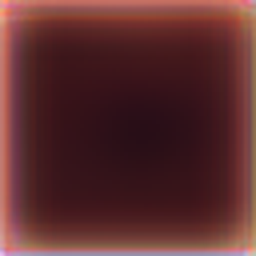

2017-08-03 23:49:48.732315: Step: 348, Generator: 14015.750977


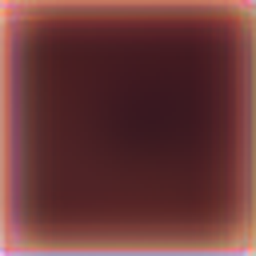

2017-08-03 23:49:55.518821: Step: 349, Generator: 11249.698242


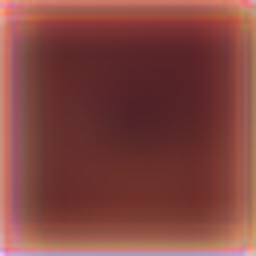

2017-08-03 23:50:02.302158: Step: 350, Generator: 13066.800781


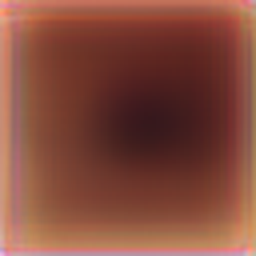

2017-08-03 23:50:08.795688: Step: 351, Generator: 12846.356445


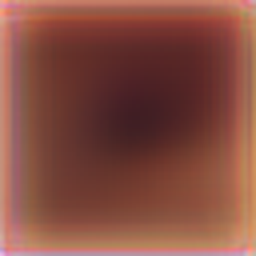

2017-08-03 23:50:15.195908: Step: 352, Generator: 13288.264648


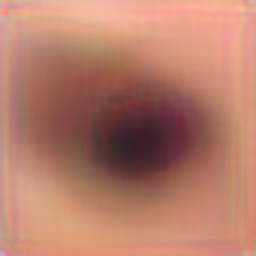

2017-08-03 23:50:21.489682: Step: 353, Generator: 13490.339844


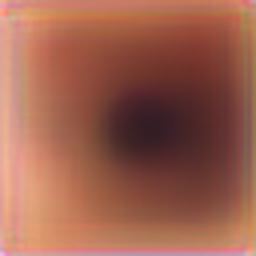

2017-08-03 23:50:27.805331: Step: 354, Generator: 13647.794922


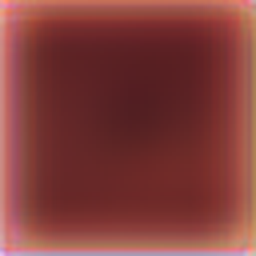

2017-08-03 23:50:34.136555: Step: 355, Generator: 13566.455078


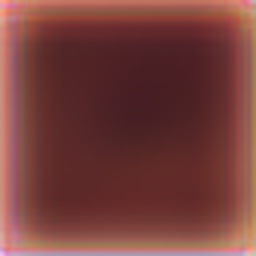

2017-08-03 23:50:40.464871: Step: 356, Generator: 10378.641602


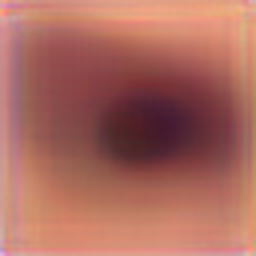

2017-08-03 23:50:46.791660: Step: 357, Generator: 10835.483398


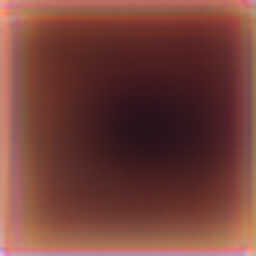

2017-08-03 23:50:53.090165: Step: 358, Generator: 11661.045898


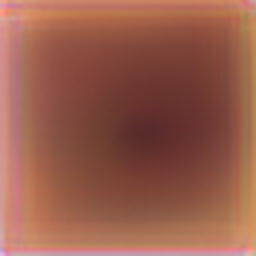

2017-08-03 23:50:59.471283: Step: 359, Generator: 14411.416992


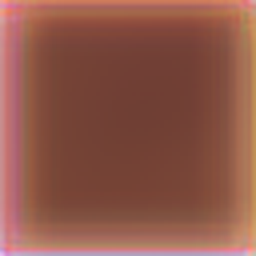

2017-08-03 23:51:05.800267: Step: 360, Generator: 12457.044922


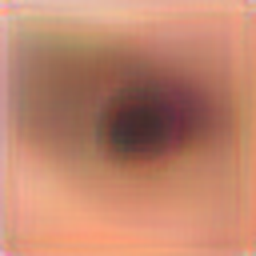

2017-08-03 23:51:12.309947: Step: 361, Generator: 12675.305664


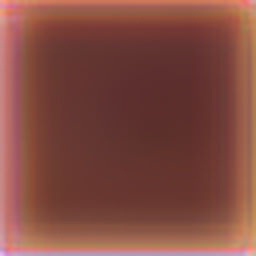

2017-08-03 23:51:18.672867: Step: 362, Generator: 11504.318359


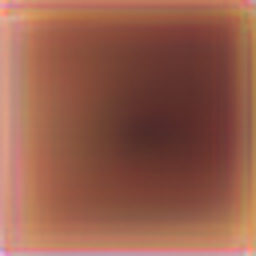

2017-08-03 23:51:24.883388: Step: 363, Generator: 11841.742188


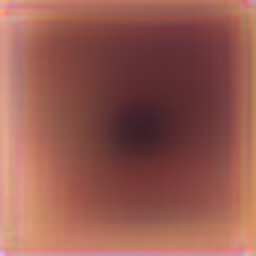

2017-08-03 23:51:31.228080: Step: 364, Generator: 10791.617188


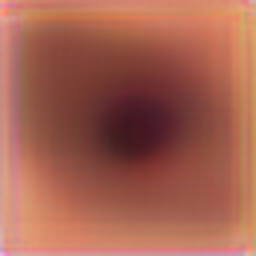

2017-08-03 23:51:37.616543: Step: 365, Generator: 13094.234375


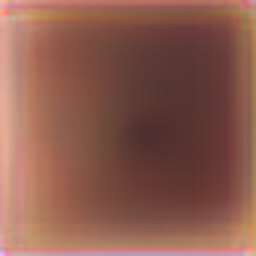

2017-08-03 23:51:44.067837: Step: 366, Generator: 17628.095703


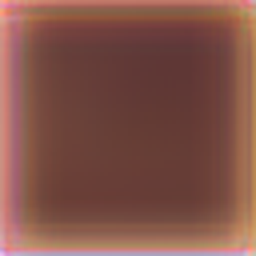

2017-08-03 23:51:47.687407: Step: 367, Generator: 7296.810059


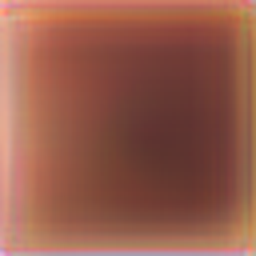

2017-08-03 23:51:54.500175: Step: 368, Generator: 11153.030273


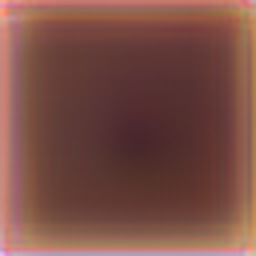

2017-08-03 23:52:01.681450: Step: 369, Generator: 11104.818359


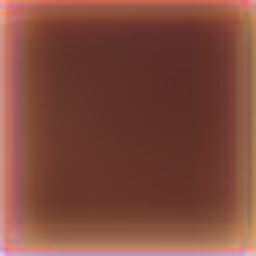

2017-08-03 23:52:08.295764: Step: 370, Generator: 12238.801758


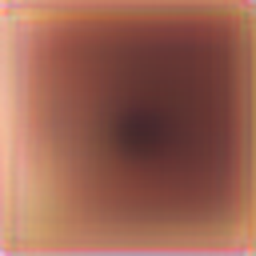

2017-08-03 23:52:14.650328: Step: 371, Generator: 11720.250000


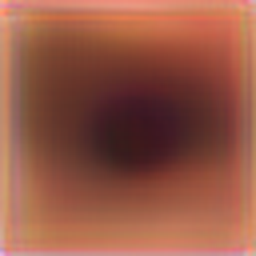

2017-08-03 23:52:20.905123: Step: 372, Generator: 10688.404297


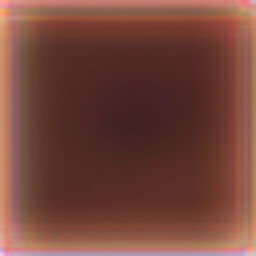

2017-08-03 23:52:27.250529: Step: 373, Generator: 13397.159180


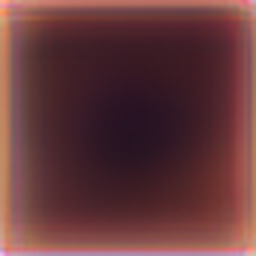

2017-08-03 23:52:36.205762: Step: 374, Generator: 11980.547852


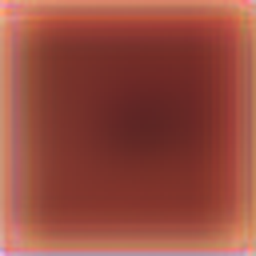

2017-08-03 23:52:46.293570: Step: 375, Generator: 13414.097656


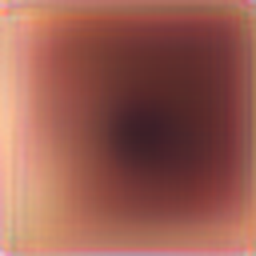

2017-08-03 23:52:55.084108: Step: 376, Generator: 10912.193359


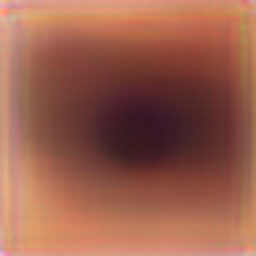

2017-08-03 23:53:03.847698: Step: 377, Generator: 10415.132812


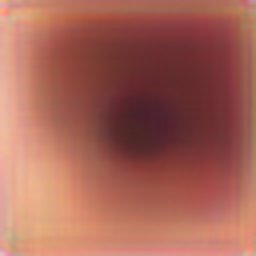

2017-08-03 23:53:12.504991: Step: 378, Generator: 11053.864258


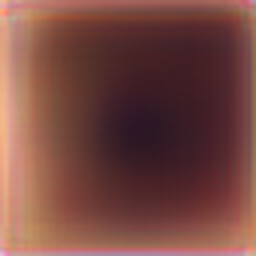

2017-08-03 23:53:21.222607: Step: 379, Generator: 10626.168945


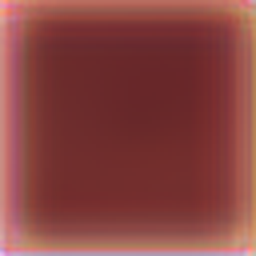

2017-08-03 23:53:29.988378: Step: 380, Generator: 12238.168945


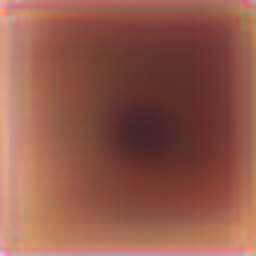

2017-08-03 23:53:37.857031: Step: 381, Generator: 10975.458008


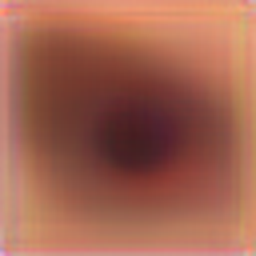

2017-08-03 23:53:46.245116: Step: 382, Generator: 10270.145508


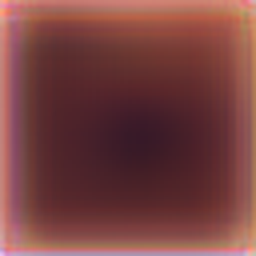

2017-08-03 23:53:54.786084: Step: 383, Generator: 11380.172852


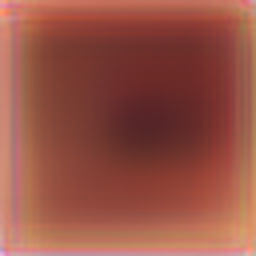

2017-08-03 23:54:04.736194: Step: 384, Generator: 12172.102539


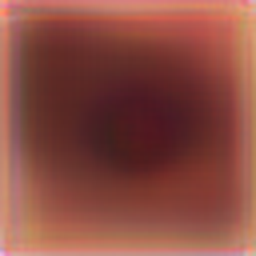

2017-08-03 23:54:12.025337: Step: 385, Generator: 11283.786133


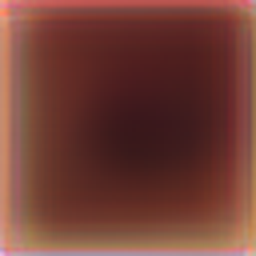

2017-08-03 23:54:19.025990: Step: 386, Generator: 10225.744141


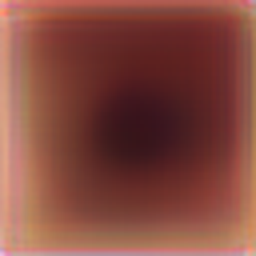

2017-08-03 23:54:28.449277: Step: 387, Generator: 11854.890625


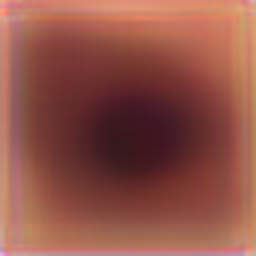

2017-08-03 23:54:38.382624: Step: 388, Generator: 11162.389648


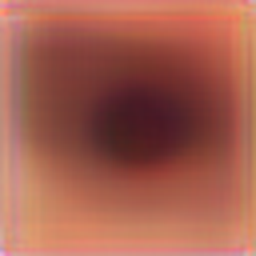

2017-08-03 23:54:51.637898: Step: 389, Generator: 10086.877930


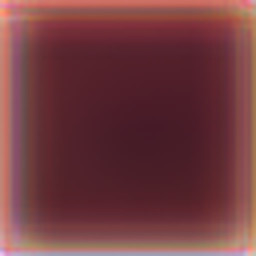

2017-08-03 23:55:01.671766: Step: 390, Generator: 10480.875000


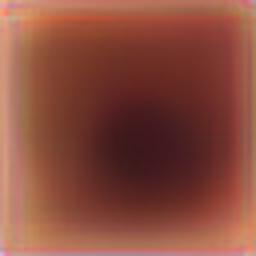

2017-08-03 23:55:11.462873: Step: 391, Generator: 11148.851562


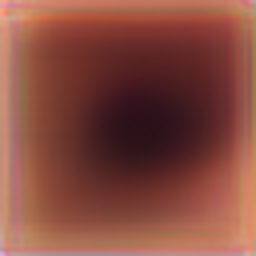

2017-08-03 23:55:21.547146: Step: 392, Generator: 13177.260742


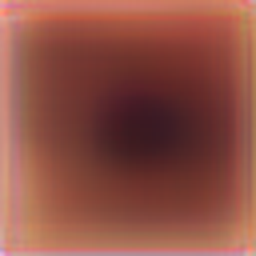

2017-08-03 23:55:31.742690: Step: 393, Generator: 11125.526367


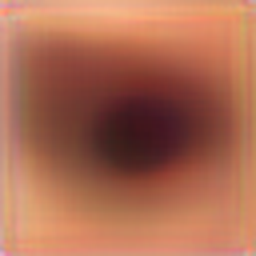

2017-08-03 23:55:41.985881: Step: 394, Generator: 11316.666016


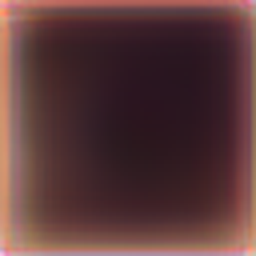

2017-08-03 23:55:52.304341: Step: 395, Generator: 12863.104492


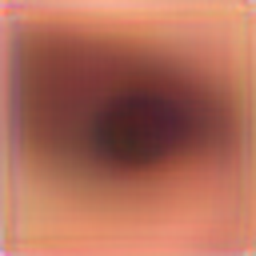

2017-08-03 23:56:04.059184: Step: 396, Generator: 12042.845703


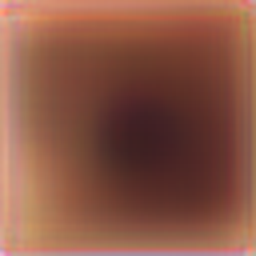

2017-08-03 23:56:14.374216: Step: 397, Generator: 10796.299805


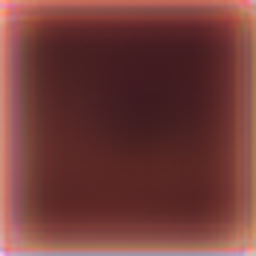

2017-08-03 23:56:23.041737: Step: 398, Generator: 10963.960938


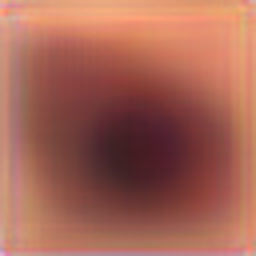

2017-08-03 23:56:32.586128: Step: 399, Generator: 11540.792969


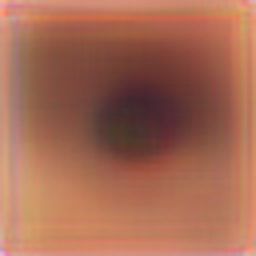

2017-08-03 23:56:43.185658: Step: 400, Generator: 11310.777344


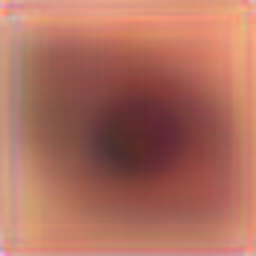

2017-08-03 23:56:52.785549: Step: 401, Generator: 10773.895508


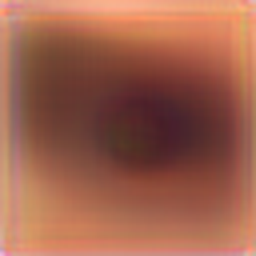

2017-08-03 23:57:03.488201: Step: 402, Generator: 11261.450195


KeyboardInterrupt: 

In [4]:
def fit(generator, iterations = 1000):
    for step in range(0, iterations):
        real = next(fake_data_gen)[0]
        training = [real, real]
        
        g_err = generator.train_on_batch(real, real)
        
        if step % 10 == 0:
            sample = generator.predict(real)
            display(output_to_image(sample[0]))
        print("%s: Step: %d, Generator: %f"%(str(datetime.now()), step, g_err))
        
fit(compile_generator(get_generator()))